## Traditional supervised machine learning approach
### Notebook 5: supervised learning
- Author： Chen Lequn
- Experiment date: __June experiment samples, SIMTech, Maraging Steel__
- Traditional machine learning approaches


In [1]:
from sklearnex import patch_sklearn, config_context
# import dpctl
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
## Required python libraries
import pandas as pd
import numpy as np
import scipy as sp
import os
import math
import sys
import itertools
from pandas import DataFrame

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import gca
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
%matplotlib inline
import seaborn as sns

# For data standardization (transformation of the data onto unit scale (mean=0 and variance=1), required in most machine learning)
from sklearn.preprocessing import StandardScaler
# For K Nearest Neighbours:
from sklearn import neighbors
# For support vector machine:
from sklearn import svm
# For Gaussian process:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.gaussian_process.kernels import RBF
# For neural network:
from sklearn.neural_network import MLPClassifier
# For decision tree:
from sklearn import tree
# For plotting the decision tree structure:
# import graphviz
# For ensemble methods: random forest ad AdaBoost
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
# For Naive Bayes method:
from sklearn.naive_bayes import GaussianNB
# For logistic regression:
from sklearn.linear_model import LogisticRegression
# For data standardization (transform the data so that they have a near-normally distribution with zero mean and unit variance)
from sklearn import preprocessing

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix

from pprint import pprint
from scipy.interpolate import griddata
from pylab import * # For adjusting frame width only
from sklearn.preprocessing import OneHotEncoder
import sklearn.gaussian_process as gp 
import sklearn.model_selection as ms
from sklearn.svm import SVR, SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_validate
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.utils import shuffle
from sklearn.linear_model import Ridge 
from sklearn.model_selection import KFold
from sklearn.preprocessing import scale
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn import svm
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle


# Use grid search with cross validation to select ML model hyper-parameters:
from sklearn.model_selection import train_test_split  # random split the data into "training data" and "testing data"
from sklearn.model_selection import GridSearchCV  # Exhaustive grid search with cross validation (CV)
from sklearn import metrics
from sklearn.metrics import classification_report

In [3]:
import joblib
#https://machinelearningmastery.com/save-load-machine-learning-models-python-scikit-learn/

In [4]:
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 2.50

In [5]:
# For plotting
import plotly.io as pio
import plotly.graph_objects as go

import numpy as np
import matplotlib.pyplot as plt

# For ML model saving
import pickle
# sns.set_theme(style="whitegrid")
# sns.set_theme(style="white", palette=None)

In [6]:
import sys
sys.path.insert(0, '../utils')
import glob
import os
import utils
import filter
import feature_extractions
from feature_extractions import amplitude_envelope
FRAME_SIZE = 2048
HOP_LENGTH = 512

In [8]:
# Where to save the figures, and dataset locations
PROJECT_ROOT_DIR = "../"

label_file = os.path.join(PROJECT_ROOT_DIR, "AM_audio_dataset", 'wave_file', 'label_v3.csv')
Experiment_PATH = os.path.join(PROJECT_ROOT_DIR, "AM_audio_dataset")
IMAGE_PATH = os.path.join(PROJECT_ROOT_DIR, "result_images", "ML", "segment", "ALL_feature_1s") #ALL_feature_1s
os.makedirs(IMAGE_PATH, exist_ok=True)

## function for automatically save the diagram/graph into the folder 
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGE_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

### change figure style

In [9]:
'''
Make frame thicker, make tick pointing inside, make tick thicker
default frame width is 2, default tick width is 1.5
'''
def frame_tick(frame_width = 2, tick_width = 1.5):
    # ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(frame_width)
    plt.tick_params(direction = 'in', 
                    width = tick_width)

'''
legend:
default location : upper left
default fontsize: 8
Frame is always off
'''
def legend(location = 'upper left', fontsize = 8):
    plt.legend(loc = location, fontsize = fontsize, frameon = False)
    
'''
savefig:
bbox_inches is always tight
'''
def savefig(filename):
    plt.savefig(filename, bbox_inches = 'tight')
    
dpi = 300

## Import extracted features

In [9]:
# df_dataset_original = pd.read_csv('..\\outputs\\June_experiments\\layer_prediction\\df_dataset_original.csv')
# df_dataset_equalized = pd.read_csv('..\\outputs\\June_experiments\\layer_prediction\\df_dataset_equalized.csv')
# df_dataset_bandpassed = pd.read_csv('..\\outputs\\June_experiments\\layer_prediction\\df_dataset_bandpassed.csv')
# df_dataset_denoised = pd.read_csv('..\\outputs\\June_experiments\\layer_prediction\\df_dataset_denoised.csv')

In [10]:
df_dataset_original = pd.read_csv('../outputs/df_dataset_original_final.csv')
df_dataset_equalized = pd.read_csv('../outputs/df_dataset_equalized_final.csv')
df_dataset_bandpassed = pd.read_csv('../outputs/df_dataset_bandpassed_final.csv')
df_dataset_denoised = pd.read_csv('../outputs/df_dataset_denoised_final.csv')

In [9]:
df_dataset_original = pd.read_csv('../outputs/df_dataset_original.csv')
df_dataset_equalized = pd.read_csv('../outputs/df_dataset_equalized.csv')
df_dataset_bandpassed = pd.read_csv('../outputs/df_dataset_bandpassed.csv')
df_dataset_denoised = pd.read_csv('../outputs/df_dataset_denoised.csv')

In [11]:
df_dataset_original.columns

Index(['Label', 'label', 'S-centroid var', 'S-entropy mean', 'BER mean',
       'S-bandwidth mean', 'S-flatness mean', 'AE mean', 'RMSE mean',
       'S-centroid mean', 'S-flux mean'],
      dtype='object')

In [202]:
df_dataset_original['Label'].unique()

array(['Defect-free', 'Cracks', 'Keyhole pores'], dtype=object)

## Constructing labels and input features for training the models

In [203]:
Label = df_dataset_original['Label'].to_list()
y = df_dataset_original['label'].to_list()


X_original_selected = df_dataset_original[['AE mean', 'AE var', 'RMSE mean',
                                         'RMSE var', 'ZCR mean', 'ZCR var', 'Rolloff mean', 'Rolloff var',
                                         'S-centroid mean', 'S-centroid var', 'S-bandwidth mean', 'S-bandwidth var',
                                         'S-flatness mean', 'S-flatness var', 'S-kurtosis mean', 'S-kurtosis var',
                                         'BER mean','BER var','S-crest mean', 'S-crest var',
                                         'S-skewness mean', 'S-skewness var', 'S-entropy mean', 'S-entropy var',
                                         'S-flux mean', 'S-flux var']].to_numpy()

X_equalized_selected = df_dataset_equalized[['AE mean', 'AE var', 'RMSE mean',
                                             'RMSE var', 'ZCR mean', 'ZCR var', 'Rolloff mean', 'Rolloff var',
                                             'S-centroid mean', 'S-centroid var', 'S-bandwidth mean', 'S-bandwidth var',
                                             'S-flatness mean', 'S-flatness var', 'S-kurtosis mean', 'S-kurtosis var',
                                             'BER mean','BER var','S-crest mean', 'S-crest var',
                                             'S-skewness mean', 'S-skewness var', 'S-entropy mean', 'S-entropy var',
                                             'S-flux mean', 'S-flux var']].to_numpy()

X_bandpassed_selected = df_dataset_bandpassed[['AE mean', 'AE var', 'RMSE mean',
                                             'RMSE var', 'ZCR mean', 'ZCR var', 'Rolloff mean', 'Rolloff var',
                                             'S-centroid mean', 'S-centroid var', 'S-bandwidth mean', 'S-bandwidth var',
                                             'S-flatness mean', 'S-flatness var', 'S-kurtosis mean', 'S-kurtosis var',
                                             'BER mean','BER var','S-crest mean', 'S-crest var',
                                             'S-skewness mean', 'S-skewness var', 'S-entropy mean', 'S-entropy var',
                                             'S-flux mean', 'S-flux var']].to_numpy()

X_denoised_selected = df_dataset_denoised[['AE mean', 'AE var', 'RMSE mean',
                                         'RMSE var', 'ZCR mean', 'ZCR var', 'Rolloff mean', 'Rolloff var',
                                         'S-centroid mean', 'S-centroid var', 'S-bandwidth mean', 'S-bandwidth var',
                                         'S-flatness mean', 'S-flatness var', 'S-kurtosis mean', 'S-kurtosis var',
                                         'BER mean','BER var','S-crest mean', 'S-crest var',
                                         'S-skewness mean', 'S-skewness var', 'S-entropy mean', 'S-entropy var',
                                         'S-flux mean', 'S-flux var']].to_numpy()

KeyError: "['AE var', 'RMSE var', 'ZCR mean', 'ZCR var', 'Rolloff mean', 'Rolloff var', 'S-bandwidth var', 'S-flatness var', 'S-kurtosis mean', 'S-kurtosis var', 'BER var', 'S-crest mean', 'S-crest var', 'S-skewness mean', 'S-skewness var', 'S-entropy var', 'S-flux var'] not in index"

In [12]:
# Label = df_dataset_original['Label'].to_list()
y = df_dataset_original['label'].to_list()


X_original_selected = df_dataset_original[['S-centroid var', 'S-entropy mean', 'BER mean',
                                           'S-bandwidth mean', 'S-flatness mean', 'AE mean', 'RMSE mean',
                                           'S-centroid mean', 'S-flux mean']].to_numpy()

X_equalized_selected = df_dataset_equalized[['S-centroid var', 'S-entropy mean', 'BER mean',
                                           'S-bandwidth mean', 'S-flatness mean', 'AE mean', 'RMSE mean',
                                           'S-centroid mean', 'S-flux mean']].to_numpy()

X_bandpassed_selected = df_dataset_bandpassed[['S-centroid var', 'S-entropy mean', 'BER mean',
                                           'S-bandwidth mean', 'S-flatness mean', 'AE mean', 'RMSE mean',
                                           'S-centroid mean', 'S-flux mean']].to_numpy()

X_denoised_selected = df_dataset_denoised[['S-centroid var', 'S-entropy mean', 'BER mean',
                                           'S-bandwidth mean', 'S-flatness mean', 'AE mean', 'RMSE mean',
                                           'S-centroid mean', 'S-flux mean']].to_numpy()

In [13]:
%store X_original_selected
%store X_equalized_selected
%store X_bandpassed_selected
%store X_denoised_selected

%store y

Stored 'X_original_selected' (ndarray)
Stored 'X_equalized_selected' (ndarray)
Stored 'X_bandpassed_selected' (ndarray)
Stored 'X_denoised_selected' (ndarray)
Stored 'y' (list)


In [15]:
X_denoised_selected.shape

(1251, 9)

### One-hot encoding

In [16]:
# from numpy import array
# from numpy import argmax
# from sklearn.preprocessing import LabelEncoder
# from sklearn.preprocessing import OneHotEncoder
# # integer encode
# label_encoder = LabelEncoder()
# # binary encode
# onehot_encoder = OneHotEncoder(sparse=False)

# values = df_dataset_original_selected["Label"].to_numpy()
# integer_encoded = label_encoder.fit_transform(values)
# integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
# Y = onehot_encoder.fit_transform(integer_encoded)
# print(integer_encoded)

## Training ML models to predict defects (layer-wise)

In [14]:
original_accuracy_mean_list = []
original_accuracy_std_list = []
equalized_accuracy_mean_list = []
equalized_accuracy_std_list = []
bandpassed_accuracy_mean_list = []
bandpassed_accuracy_std_list = []
denoised_accuracy_mean_list = []
denoised_accuracy_std_list = []

original_auc_mean = []
original_auc_std = []
equalized_auc_mean = []
equalized_auc_std = []
bandpassed_auc_mean = []
bandpassed_auc_std = []
denoised_auc_mean = []
denoised_auc_std = []

import time

### Decision tree classification

In [15]:
def DT_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                       labels_=['Defect-free', 'Cracks','Keyhole pores']):
    
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "DT"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    # Optimize the classfier's hyper-parameters:
    # Ref: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
    tuned_parameters = {'criterion': ['gini', 'entropy'],
                        'splitter': ['best', 'random'],
                        'max_depth': [2,3,4,5,6],
                        'min_samples_split': [2,3,4,5,6]}    # a dict (dictionary)

    clf = GridSearchCV(tree.DecisionTreeClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)
    
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    print("\nBest parameters set found on development set:")
    print(clf.best_params_)

    score = clf.score(X_test, Y_test)
    # print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    # print("\nAccuracy of Decision Tree classifier (testing data):")
    # print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)
    
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=3)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

Best parameters set found on development set:
{'criterion': 'entropy', 'max_depth': 6, 'min_samples_split': 4, 'splitter': 'best'}

classification report:
              precision    recall  f1-score   support

           0    0.90625   0.79091   0.84466       110
           1    0.52083   0.69444   0.59524        72
           2    0.72881   0.62319   0.67188        69

    accuracy                        0.71713       251
   macro avg    0.71863   0.70285   0.70392       251
weighted avg    0.74691   0.71713   0.72561       251

Test Accuracy (cross-validation) for DT = 0.72102 ± 0.01961
micro-averaging AUC for DT = 0.86758 ± 0.00000
Saving figure ROC_DT_original

-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

Best parameters set found on dev

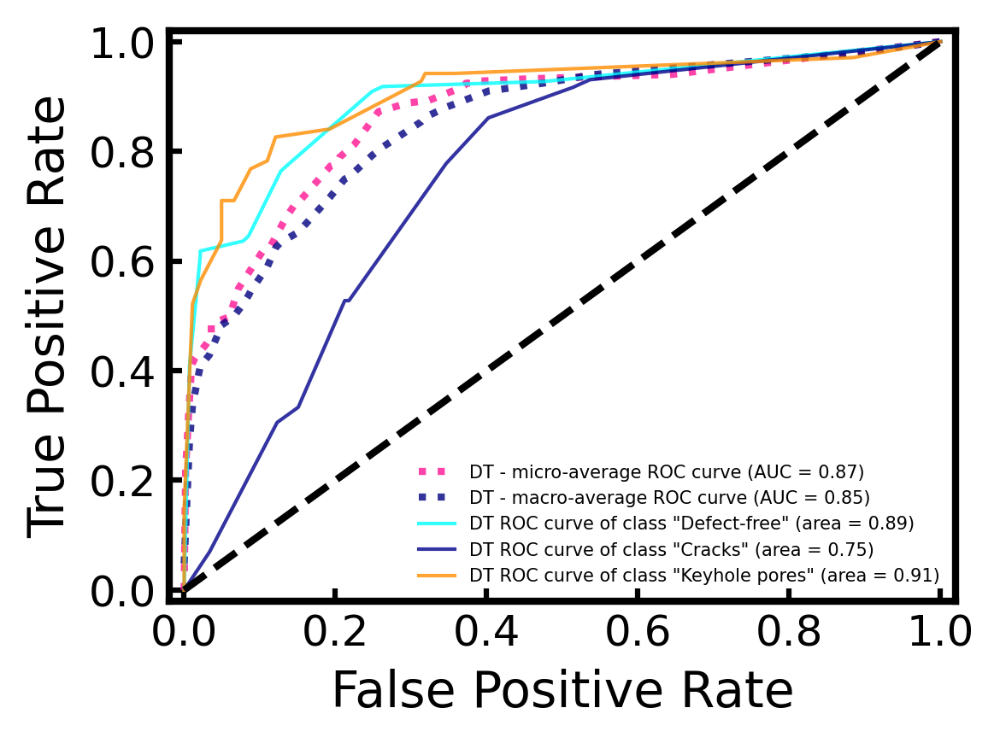

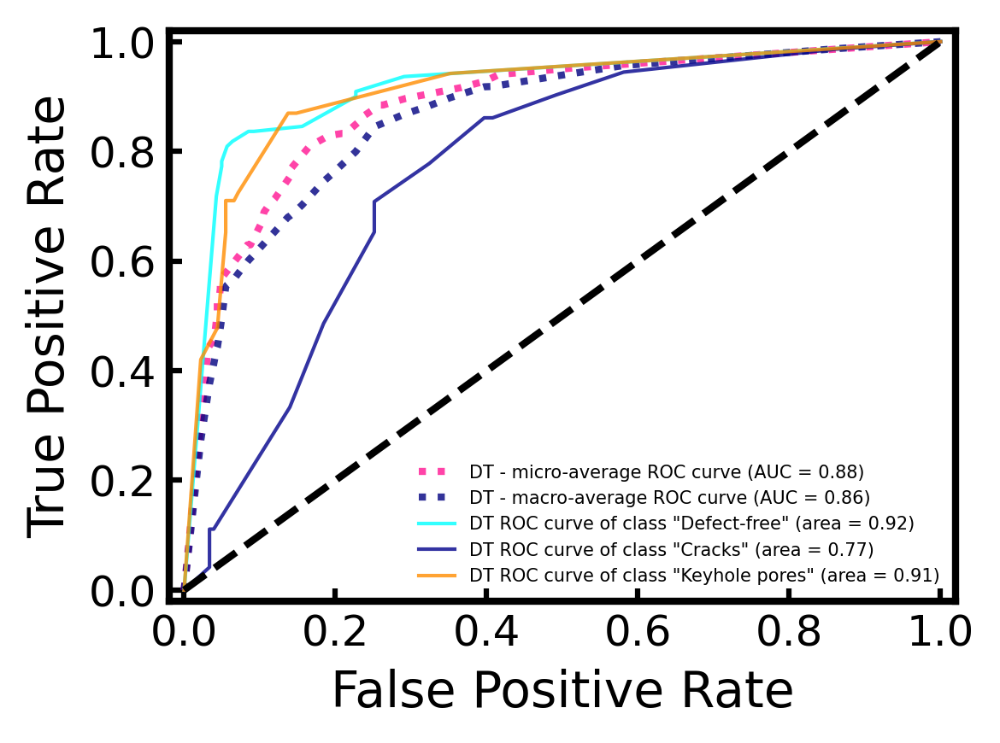

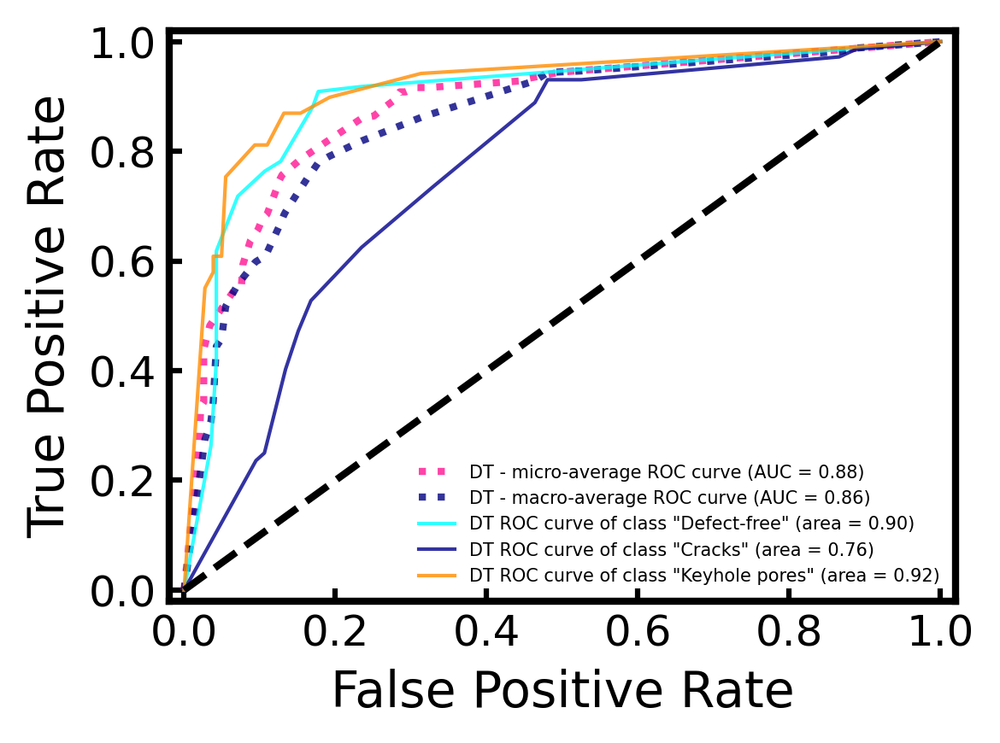

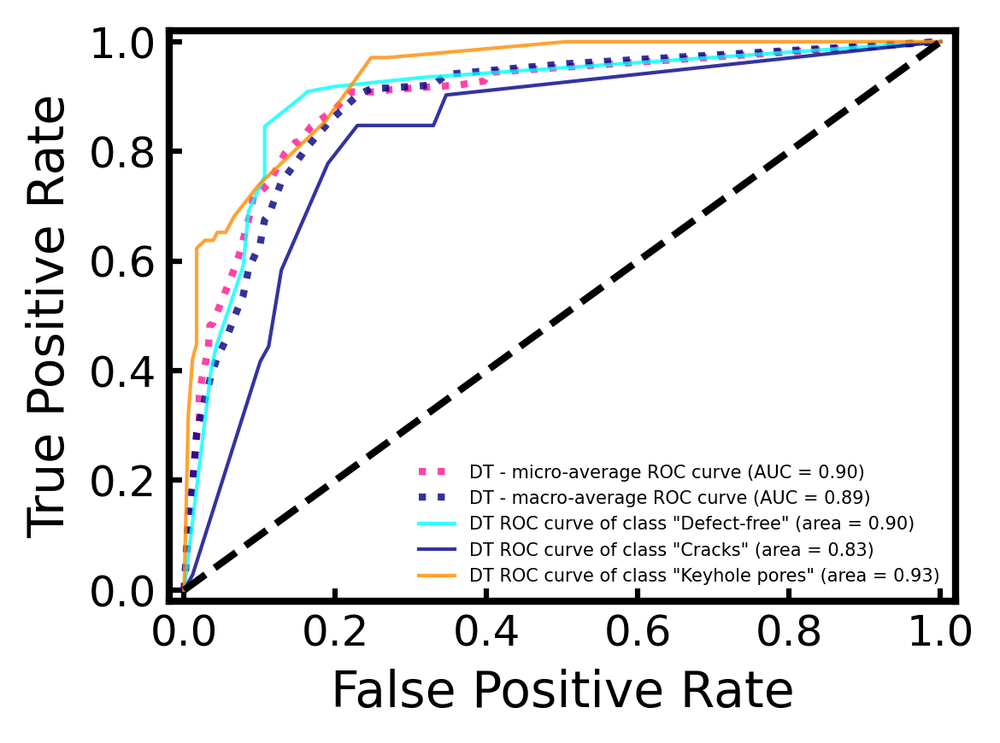

In [16]:
DT_original = DT_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
DT_equalized = DT_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
DT_bandpassed = DT_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
DT_denoised = DT_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### AdaBoost classification

In [17]:
def AdaBoost_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                             labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "AdaBoost"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    # Optimize the classfier's hyper-parameters:
    # Ref: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
    tuned_parameters = {'n_estimators': [2,4,6,10],
                        'algorithm': ['SAMME', 'SAMME.R']}    # a dict (dictionary)

    clf = GridSearchCV(AdaBoostClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    print("\nBest parameters set found on development set:")
    print(clf.best_params_)

    score = clf.score(X_test, Y_test)
    # print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    # print("\nAccuracy of AdaBoost classifier (testing data):")
    # print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)
    
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    

    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

Best parameters set found on development set:
{'algorithm': 'SAMME.R', 'n_estimators': 10}

classification report:
              precision    recall  f1-score   support

           0    0.83133   0.62727   0.71503       110
           1    0.45946   0.70833   0.55738        72
           2    0.82456   0.68116   0.74603        69

    accuracy                        0.66534       251
   macro avg    0.70512   0.67226   0.67281       251
weighted avg    0.72280   0.66534   0.67833       251

Test Accuracy (cross-validation) for AdaBoost = 0.63707 ± 0.02674
micro-averaging AUC for AdaBoost = 0.88525 ± 0.00000
Saving figure ROC_AdaBoost_original

-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

Best parameters set found on development set:
{'algori

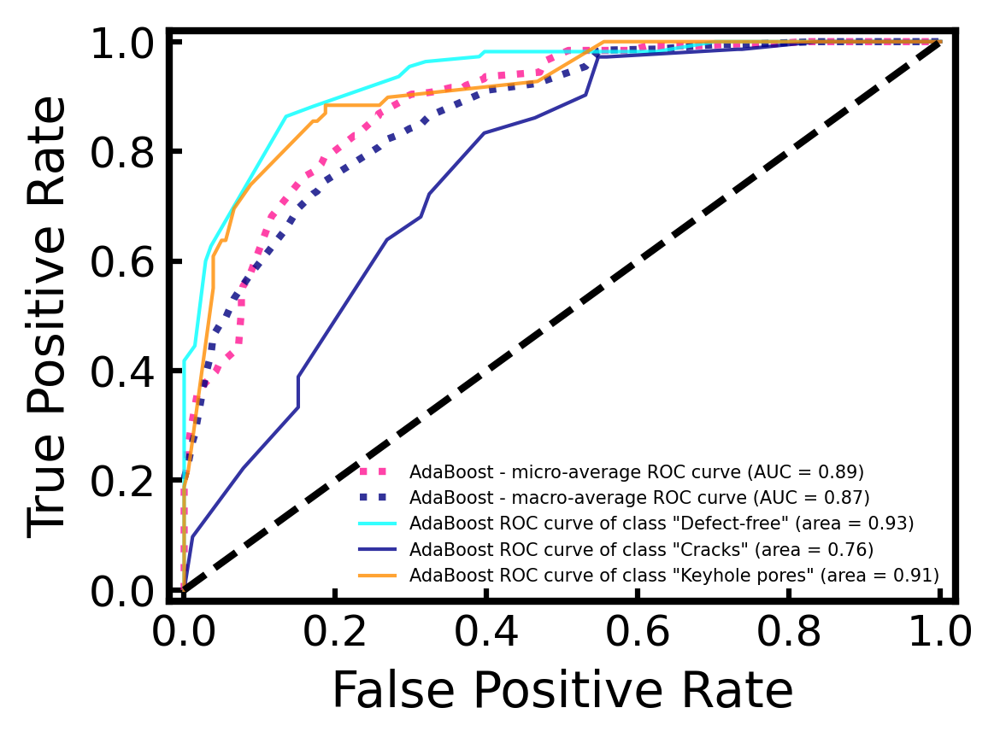

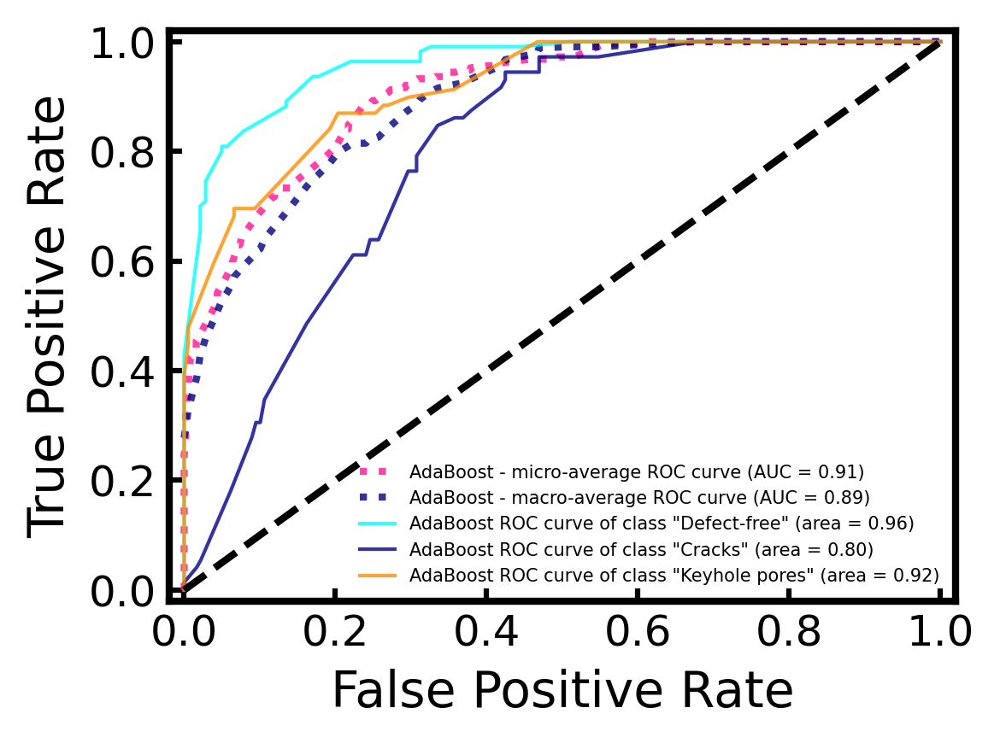

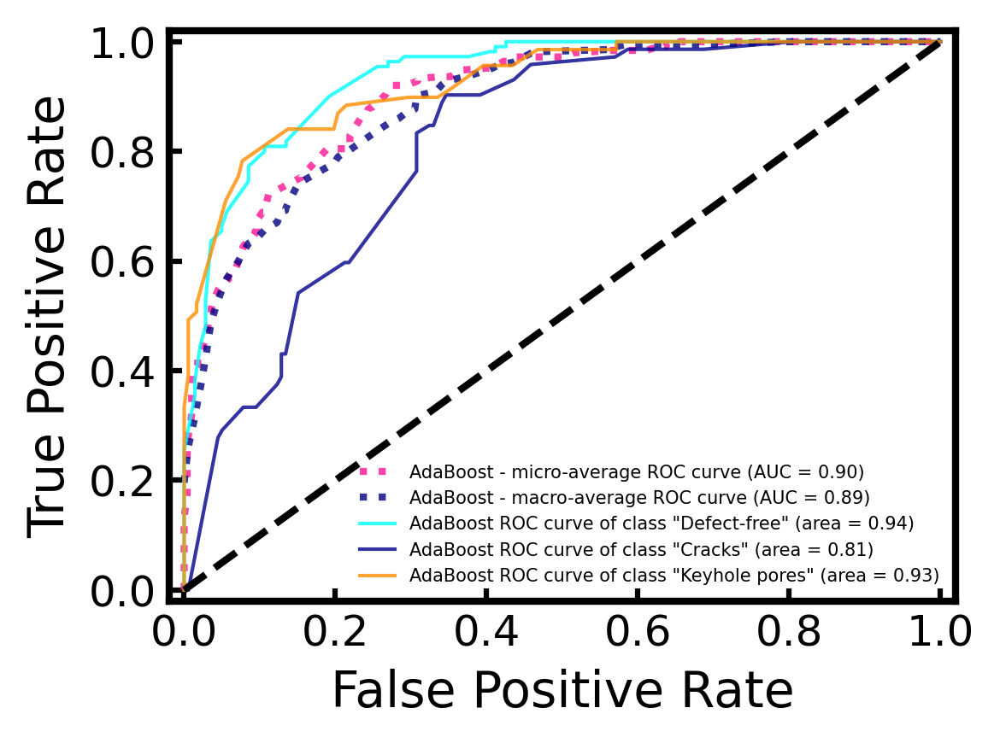

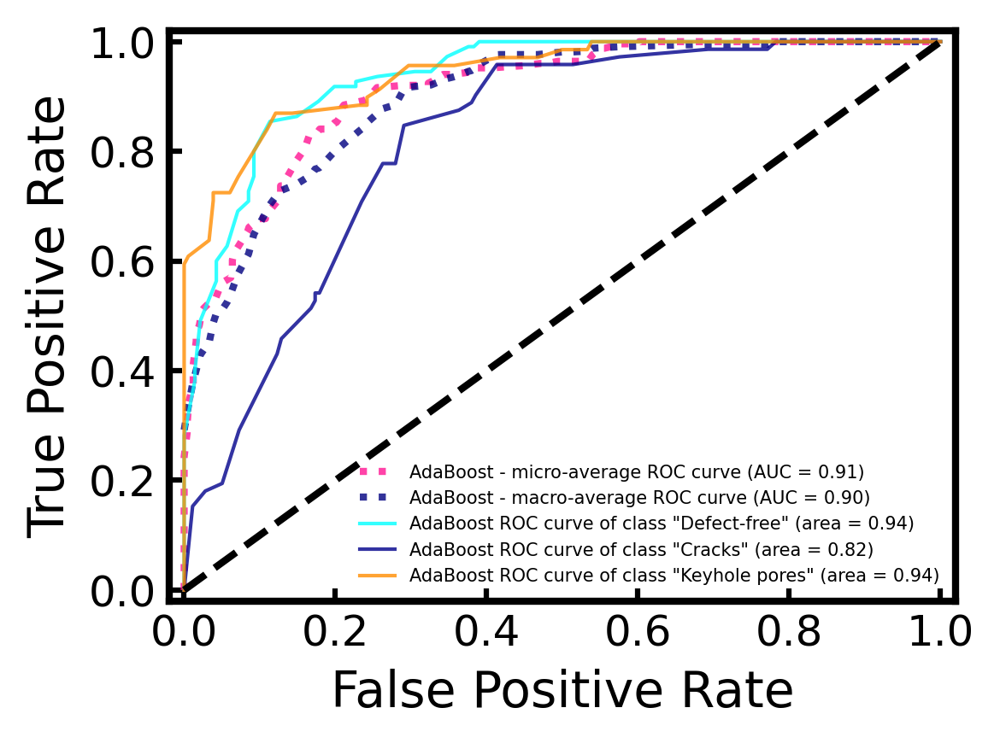

In [18]:
Adaboost_original = AdaBoost_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
Adaboost_equalized = AdaBoost_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
Adaboost_bandpassed = AdaBoost_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
Adaboost_denoised = AdaBoost_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### Naive Bayes classification

In [19]:
def naive_bayes_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                               labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "NB"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    clf = GaussianNB()

    clf.fit(X_train, Y_train)

    score = clf.score(X_test, Y_test)
    # print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    # print("\nAccuracy of Naive Bayes classifier (testing data):")
    # print(metrics.accuracy_score(Y_test, Y_predict))
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))
    
    filename = "models/" + classifier_name + "_" + signal_type +'.pkl'
    with open (filename, 'wb') as file:
        pickle.dump(clf,file)

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()

    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

classification report:
              precision    recall  f1-score   support

           0    0.84211   0.58182   0.68817       110
           1    0.40323   0.69444   0.51020        72
           2    0.64706   0.47826   0.55000        69

    accuracy                        0.58566       251
   macro avg    0.63080   0.58484   0.58279       251
weighted avg    0.66259   0.58566   0.59914       251

Test Accuracy (cross-validation) for NB = 0.57553 ± 0.01685
micro-averaging AUC for NB = 0.79133 ± 0.00000
Saving figure ROC_NB_original

-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

classification report:
              precision    recall  f1-score   support

           0    0.76923   0.72727   0.74766       110
           1    0.46078   0.6527

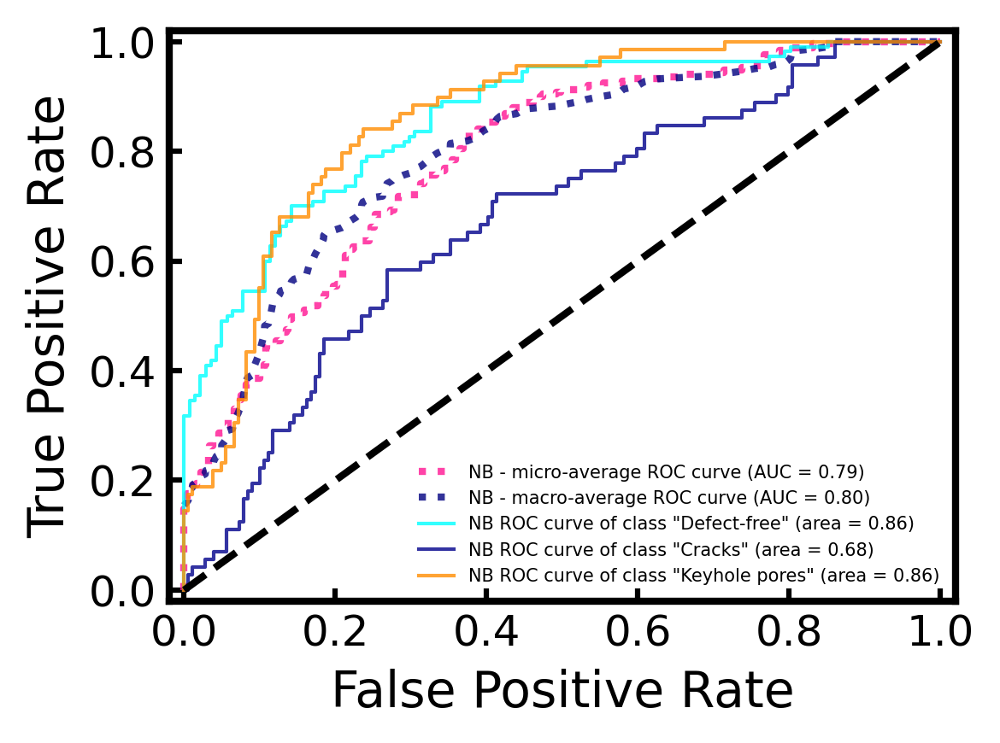

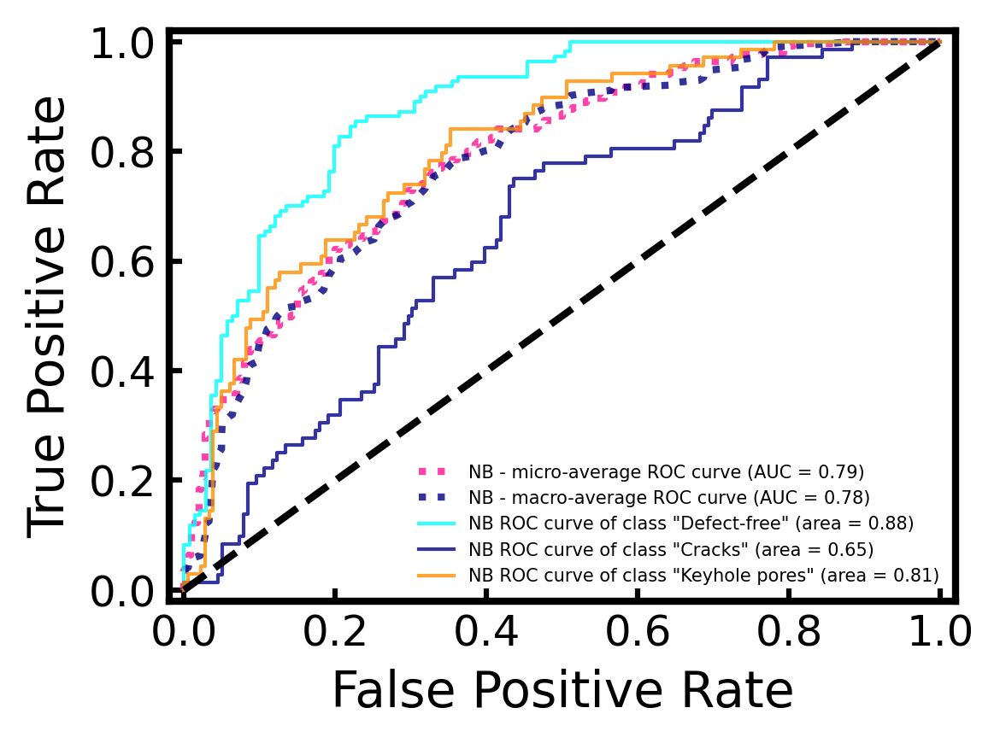

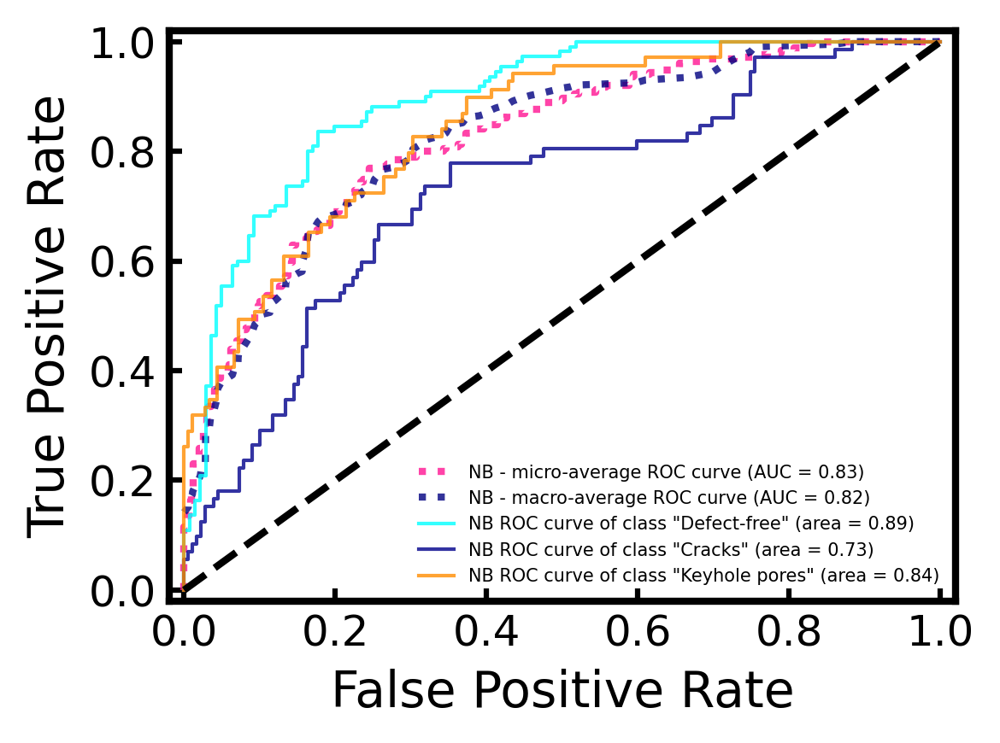

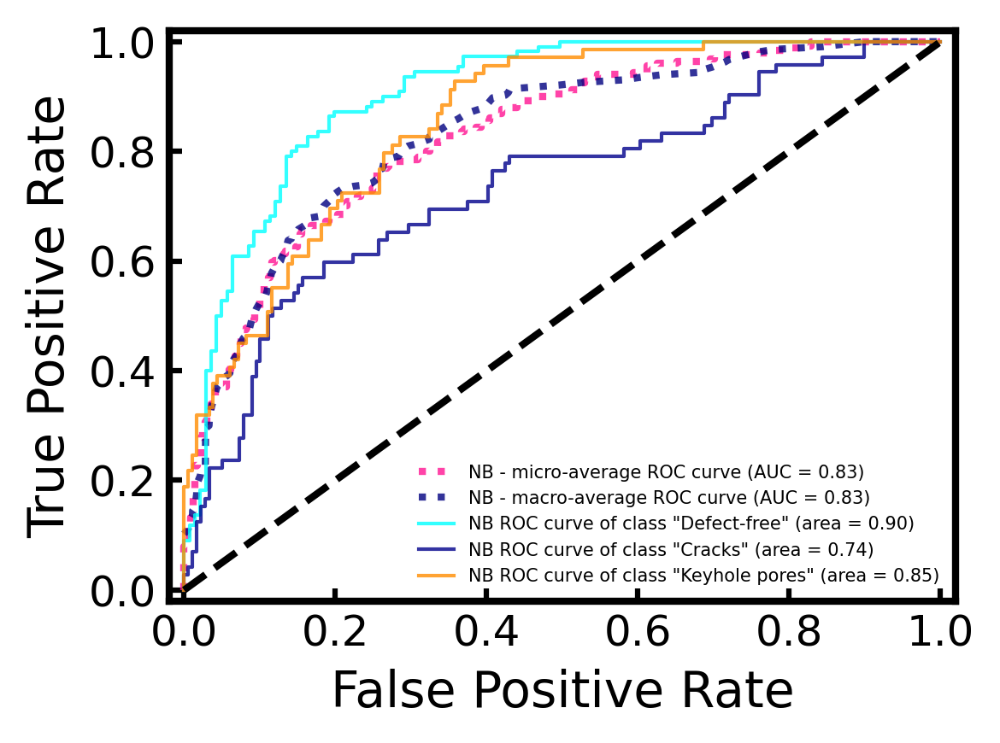

In [20]:
NB_original = naive_bayes_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
NB_equalized = naive_bayes_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
NB_bandpassed = naive_bayes_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
NB_denoised = naive_bayes_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

In [212]:
X_train, X_test, Y_train, Y_test = train_test_split(X_denoised_selected, y, test_size=0.1, random_state=0, shuffle=True)
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, Y_train)
filename = "models/" + "_" + "NB_test" +'.pkl'
# with open (filename, 'wb') as file:
#     pickle.dump(nb_classifier,file)
pickle.dump(nb_classifier, open(filename, 'wb'))

In [213]:
# model_nb_original = joblib.load('models/NB_denoised.pkl')
# model_nb_original.score(X_denoised_selected, y)
# with open('models/_NB_test.pkl', 'rb') as file:
#     model_nb_model = pickle.load(file)
model_nb_model = pickle.load(open(filename, 'rb'))

model_nb_model.score(X_test, Y_test)

0.6190476190476191

### Random Forest Classification

In [21]:
def RF_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                       labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "RF"
    # Binarize the output
    Y = label_binarize(Y, classes=[0, 1, 2])
    n_classes = Y.shape[1]
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    # Optimize the classfier's hyper-parameters:
    # Ref: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
    tuned_parameters = {'n_estimators': [2,4,6,10],
                        'criterion': ['gini', 'entropy'],
                        'max_depth': [2,3,4],
                        'min_samples_split': [2,3,4,5,6]}    # a dict (dictionary)

    clf = GridSearchCV(RandomForestClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    print("\nBest parameters set found on development set:")
    print(clf.best_params_)        

    score = clf.score(X_test, Y_test)
    # print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)

    # print("\nAccuracy of Random Forest classifier (testing data):")
    # print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=3)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
 
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]

In [22]:
Y_2 = label_binarize(y, classes=[0, 1, 2])

In [40]:
# RF_original

/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

Best parameters set found on development set:
{'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 6, 'n_estimators': 2}

classification report:
              precision    recall  f1-score   support

           0    0.92308   0.54545   0.68571       110
           1    0.52727   0.40278   0.45669        72
           2    0.81818   0.65217   0.72581        69

   micro avg    0.76571   0.53386   0.62911       251
   macro avg    0.75618   0.53347   0.62274       251
weighted avg    0.78070   0.53386   0.63104       251
 samples avg    0.53386   0.53386   0.53386       251



/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o

Test Accuracy (cross-validation) for RF = 0.49880 ± 0.06420
micro-averaging AUC for RF = 0.89729 ± 0.00000
Saving figure ROC_RF_original


/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o


-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

Best parameters set found on development set:
{'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 2, 'n_estimators': 10}

classification report:
              precision    recall  f1-score   support

           0    0.88000   0.80000   0.83810       110
           1    0.58696   0.37500   0.45763        72
           2    0.87234   0.59420   0.70690        69

   micro avg    0.80829   0.62151   0.70270       251
   macro avg    0.77977   0.58973   0.66754       251
weighted avg    0.79383   0.62151   0.69289       251
 samples avg    0.62151   0.62151   0.62151       251



/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o

Test Accuracy (cross-validation) for RF = 0.62990 ± 0.00815
micro-averaging AUC for RF = 0.90854 ± 0.00000
Saving figure ROC_RF_equalized


/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o


-------------------------------------------------------------------------------------------------

-------------Signal type: bandpassed-----------

Best parameters set found on development set:
{'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 2, 'n_estimators': 4}

classification report:
              precision    recall  f1-score   support

           0    0.88660   0.78182   0.83092       110
           1    0.56140   0.44444   0.49612        72
           2    0.77612   0.75362   0.76471        69

   micro avg    0.76923   0.67729   0.72034       251
   macro avg    0.74137   0.65996   0.69725       251
weighted avg    0.76294   0.67729   0.71668       251
 samples avg    0.67729   0.67729   0.67729       251



/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o

Test Accuracy (cross-validation) for RF = 0.68585 ± 0.00853
micro-averaging AUC for RF = 0.90466 ± 0.00000
Saving figure ROC_RF_bandpassed


/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o


-------------------------------------------------------------------------------------------------

-------------Signal type: denoised-----------

Best parameters set found on development set:
{'criterion': 'gini', 'max_depth': 4, 'min_samples_split': 4, 'n_estimators': 6}

classification report:
              precision    recall  f1-score   support

           0    0.84848   0.76364   0.80383       110
           1    0.63333   0.52778   0.57576        72
           2    0.81967   0.72464   0.76923        69

   micro avg    0.78182   0.68526   0.73036       251
   macro avg    0.76716   0.67202   0.71627       251
weighted avg    0.77885   0.68526   0.72889       251
 samples avg    0.68526   0.68526   0.68526       251



/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/home/lequn/anaconda3/envs/simtech/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` o

Test Accuracy (cross-validation) for RF = 0.68265 ± 0.00493
micro-averaging AUC for RF = 0.90684 ± 0.00000
Saving figure ROC_RF_denoised


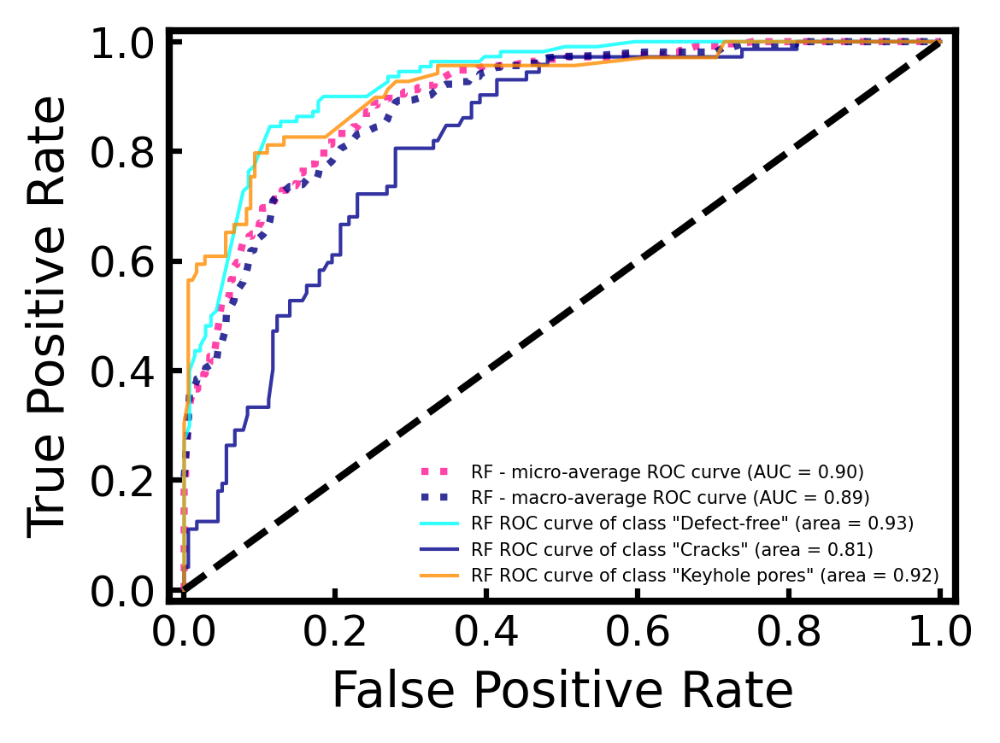

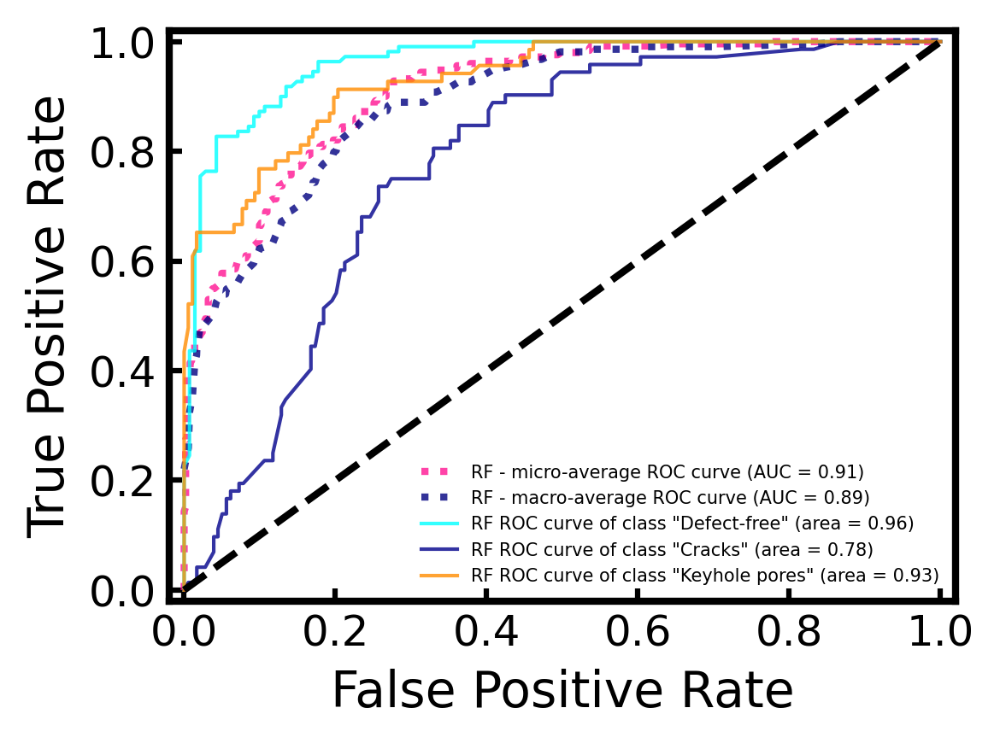

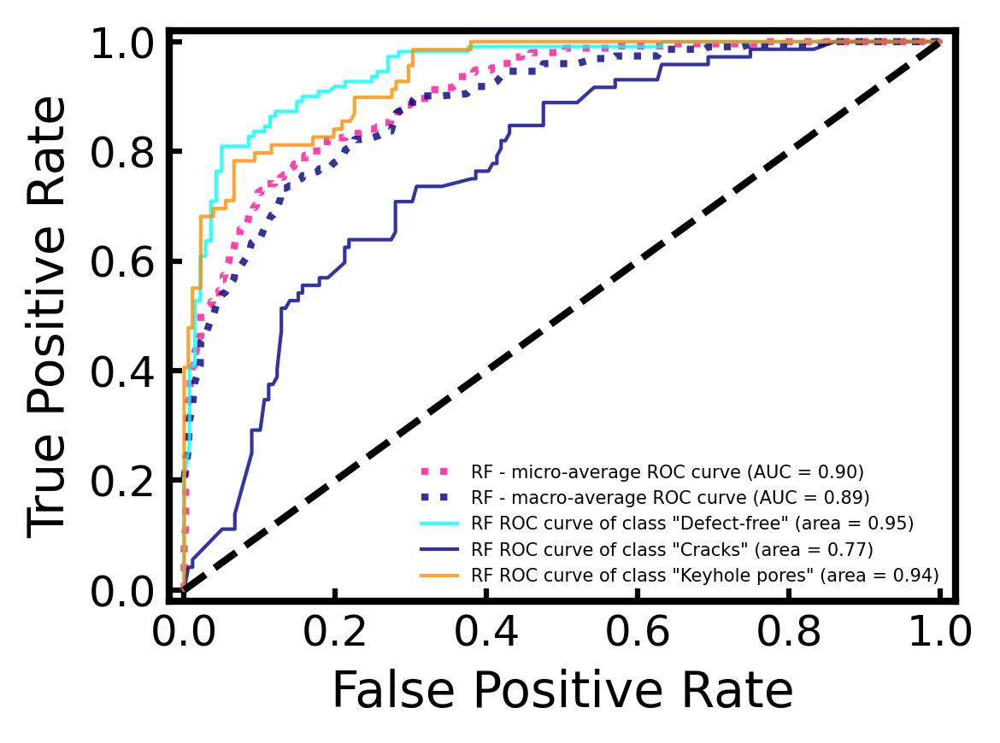

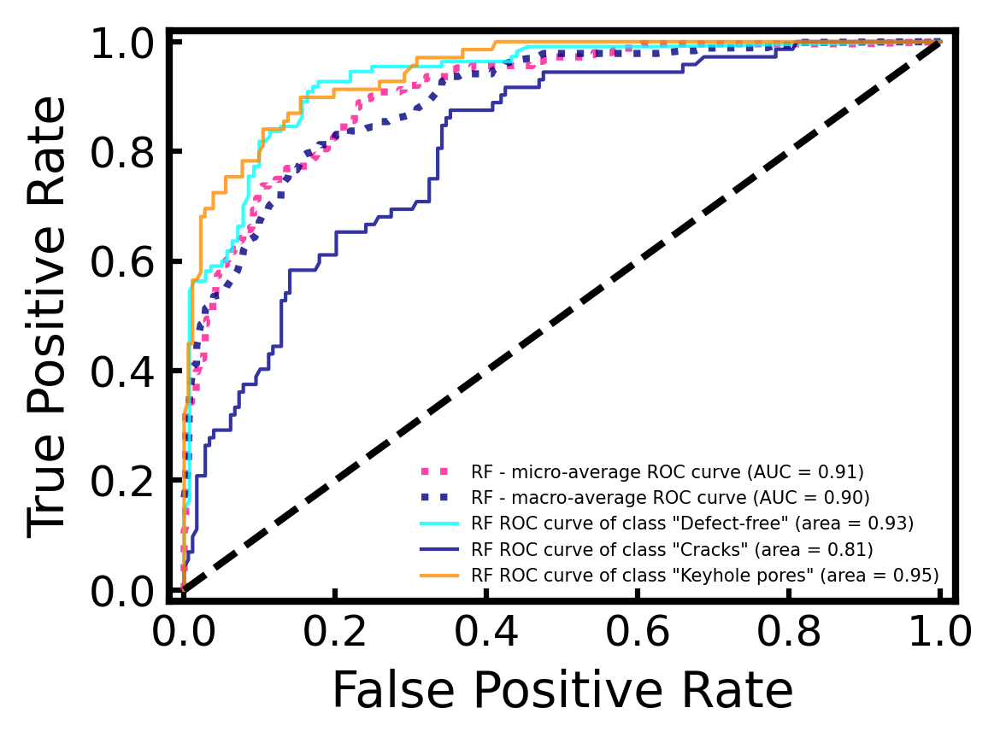

In [23]:
RF_original = RF_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
RF_equalized = RF_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
RF_banpassed = RF_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
RF_denoised = RF_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

In [58]:
RF_banpassed

[array([[0, 0, 0],
        [0, 0, 1],
        [0, 0, 1],
        [0, 0, 1],
        [1, 0, 0],
        [0, 1, 0],
        [0, 0, 1],
        [0, 0, 1],
        [0, 0, 0],
        [0, 0, 0],
        [0, 1, 0],
        [0, 1, 0],
        [1, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        [1, 0, 0],
        [0, 1, 0],
        [0, 1, 0],
        [0, 0, 1],
        [1, 0, 0],
        [1, 0, 0],
        [0, 0, 1],
        [1, 0, 0],
        [0, 0, 1],
        [1, 0, 0],
        [1, 0, 0],
        [1, 0, 0],
        [0, 1, 0],
        [0, 1, 0],
        [0, 0, 0],
        [0, 0, 1],
        [0, 0, 1],
        [1, 0, 0],
        [0, 0, 1],
        [0, 1, 0],
        [0, 1, 0],
        [0, 1, 0],
        [1, 0, 0],
        [0, 0, 0],
        [1, 0, 0],
        [1, 0, 0],
        [0, 1, 0],
        [0, 0, 0],
        [1, 0, 0],
        [0, 1, 0],
        [1, 0, 0],
        [0, 1, 0],
        [0, 1, 0],
        [0, 1, 0],
        [0, 0, 1],
        [1, 0, 0],
        [0, 1, 0],
        [1, 

### KNN

In [24]:
def KNN_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                        labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "KNN"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    # Optimize the K-Nearest Neighbors Classfier's hyper-parameters:
    # Ref: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
    tuned_parameters = {'n_neighbors': [3, 4, 5, 6, 7, 8, 9],
                        'weights': ['uniform', 'distance'],
                        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}    # a dict (dictionary)

    clf = GridSearchCV(neighbors.KNeighborsClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    print("\nBest parameters set found on development set:")
    print(clf.best_params_)

    score = clf.score(X_test, Y_test)
    print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of Nearest Neighbors classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))
    
    # filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    # joblib.dump(clf, filename)
    
#     best_model = neighbors.KNeighborsClassifier(algorithm='auto', n_neighbors= 4, weights= 'distance') 
#     best_model.fit(X, Y)
#     filename = "models/" + classifier_name + "_" + signal_type +'.pkl'
#     with open (filename, 'wb') as file:
#         pickle.dump(best_model,file)

    # knn_classifier = neighbors.KNeighborsClassifier(n_neighbors=5, algorithm='auto')
    # knn_classifier.fit(X, Y)
    # filename = "models/" +  classifier_name + "_" + signal_type + '.pkl'
    # # with open (filename, 'wb') as file:
    # #     pickle.dump(knn_classifier,file)
    # pickle.dump(knn_classifier, open(filename, 'wb'))
    
    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=3)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
        
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)

    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]

In [25]:
X_train, X_test, Y_train, Y_test = train_test_split(X_original_selected, y, test_size=0.1, random_state=0, shuffle=True)
knn_classifier = neighbors.KNeighborsClassifier(n_neighbors=5, algorithm='auto')
knn_classifier.fit(X_train, Y_train)

filename = "models/" + "_" + "KNN_test" +'.pkl'
# with open (filename, 'wb') as file:
#     pickle.dump(knn_classifier,file)
pickle.dump(knn_classifier, open(filename, 'wb'))


Best parameters set found on development set:
{'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}

Test score: 0.7848605577689243

Accuracy of Nearest Neighbors classifier (testing data):
0.7848605577689243

classification report:
              precision    recall  f1-score   support

           0    0.82258   0.92727   0.87179       110
           1    0.66129   0.56944   0.61194        72
           2    0.83077   0.78261   0.80597        69

    accuracy                        0.78486       251
   macro avg    0.77155   0.75978   0.76324       251
weighted avg    0.77857   0.78486   0.77916       251

Test Accuracy (cross-validation) for KNN = 0.77218 ± 0.01223
micro-averaging AUC for KNN = 0.92937 ± 0.00000
Saving figure ROC_KNN_original

Best parameters set found on development set:
{'algorithm': 'auto', 'n_neighbors': 3, 'weights': 'distance'}

Test score: 0.8247011952191236

Accuracy of Nearest Neighbors classifier (testing data):
0.8247011952191236

classification r

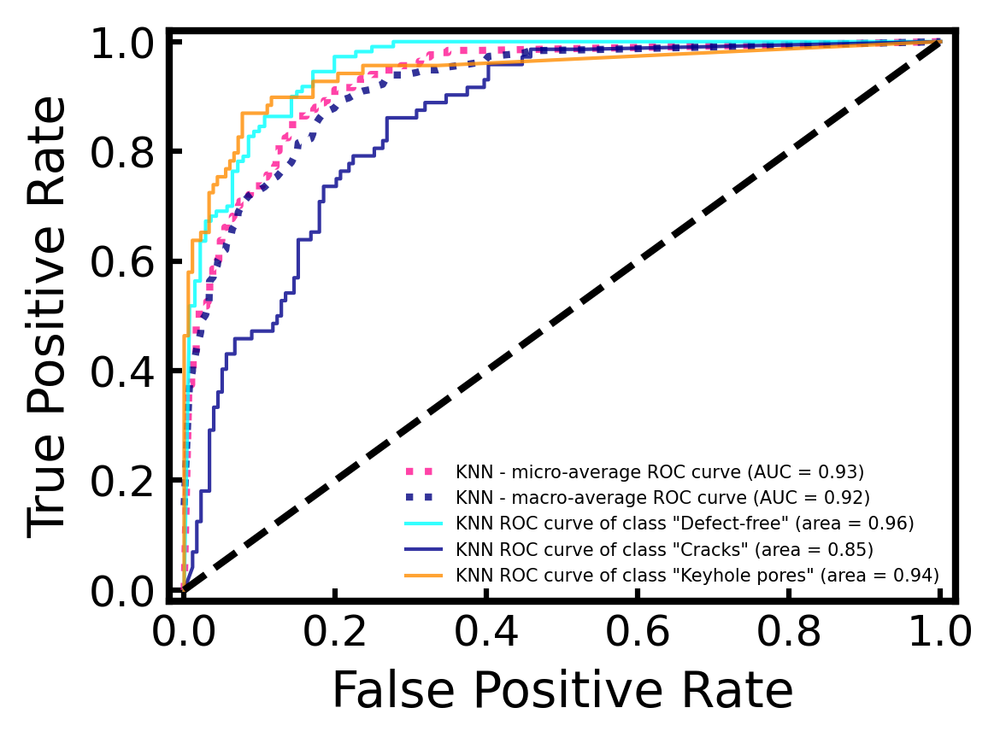

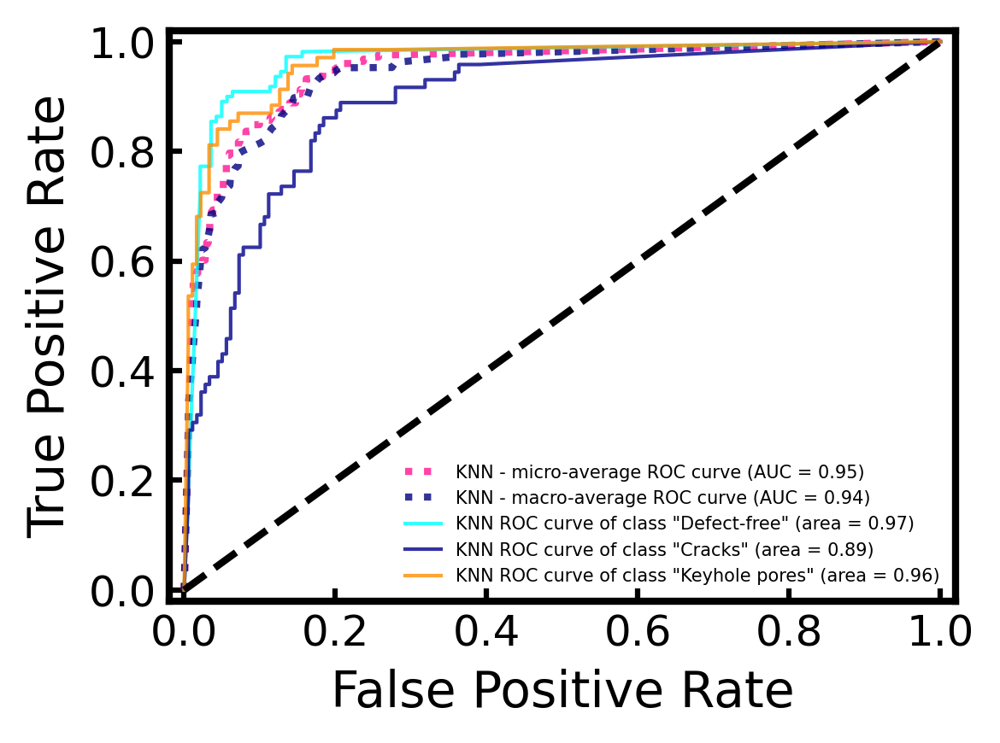

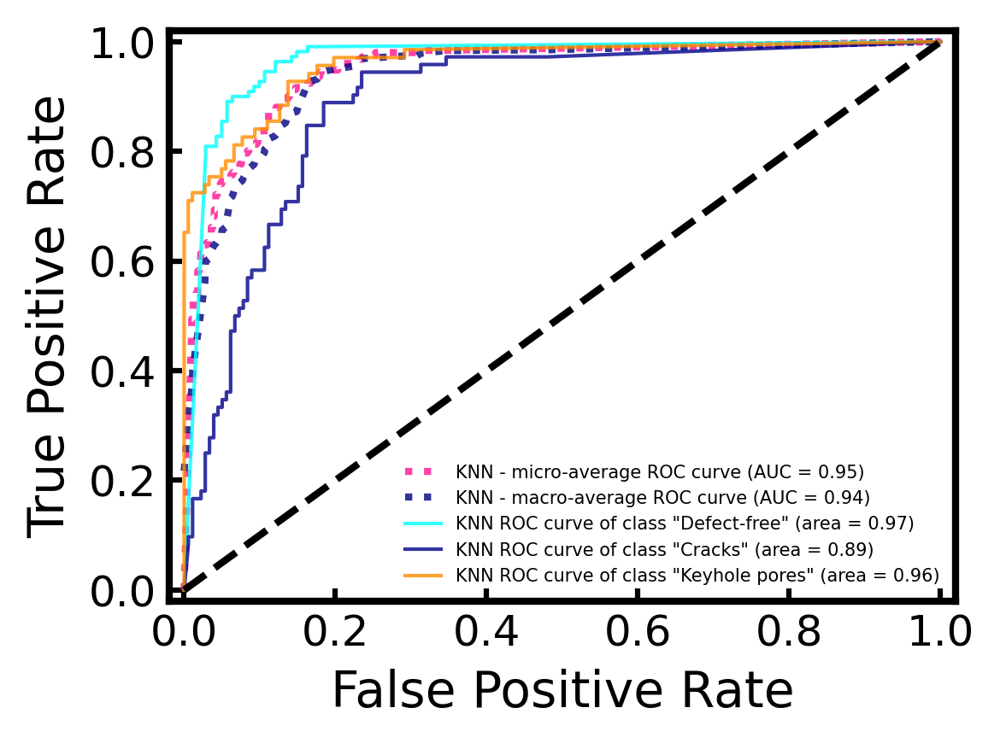

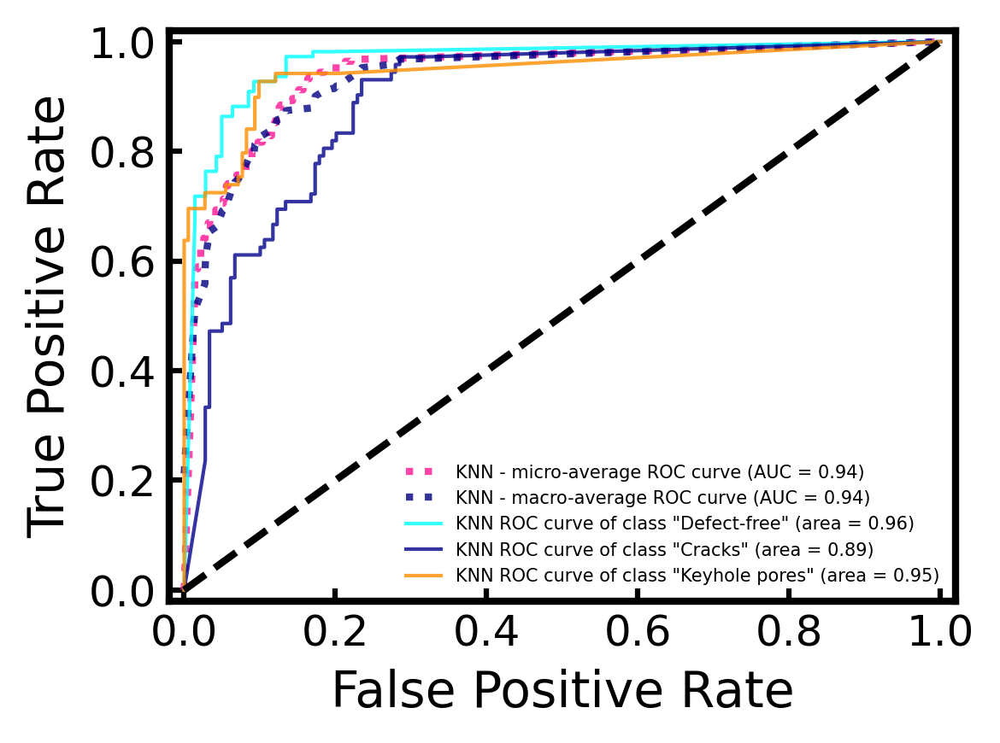

In [26]:
KNN_original = KNN_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
KNN_equalized = KNN_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
KNN_bandpassed = KNN_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
KNN_denoised = KNN_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

In [197]:
# model_nb_original = joblib.load('models/NB_denoised.pkl')
# model_nb_original.score(X_denoised_selected, y)
# with open('models/KNN_equalized.pkl', 'rb') as file:
#     model_knn_model = pickle.load(file)
filename ='models/KNN_equalized.pkl'
model_knn_model = pickle.load(open(filename, 'rb'))

# Y_ohe = label_binarize(y, classes=[0, 1, 2])
model_knn_model.score(X_equalized_selected, y)
# model_nb_model.predict(X_bandpassed_selected)
# model_knn_model

0.38609112709832133

### Guassian Process 

In [27]:
def guassian_process_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                                  labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "GP"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    kernel = 1.0 * RBF(1.0)
    tuned_parameters = {'kernel': [kernel],
                        'optimizer': [None, 'fmin_l_bfgs_b']}    # a dict (dictionary)

    clf = GridSearchCV(GaussianProcessClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    score = clf.score(X_test, Y_test)
    print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of logistic regression classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)
    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]

In [28]:
# GP_original = guassian_process_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
# GP_equalized = guassian_process_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
# GP_bandpassed = guassian_process_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
# GP_denoised = guassian_process_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### Logistic regression

In [31]:
def logistic_regression_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                                        labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "LR"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    clf = LogisticRegression()

    clf.fit(X_train, Y_train)

    score = clf.score(X_test, Y_test)
    print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of logistic regression classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))
    
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

Test score: 0.7689243027888446

Accuracy of logistic regression classifier (testing data):
0.7689243027888446

classification report:
              precision    recall  f1-score   support

           0    0.87963   0.86364   0.87156       110
           1    0.58537   0.66667   0.62338        72
           2    0.81967   0.72464   0.76923        69

    accuracy                        0.76892       251
   macro avg    0.76156   0.75165   0.75472       251
weighted avg    0.77874   0.76892   0.77224       251

Test Accuracy (cross-validation) for LR = 0.74898 ± 0.02498
micro-averaging AUC for LR = 0.91619 ± 0.00000
Saving figure ROC_LR_original

-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

Test score: 0.7370517928286853

Accuracy of logistic 

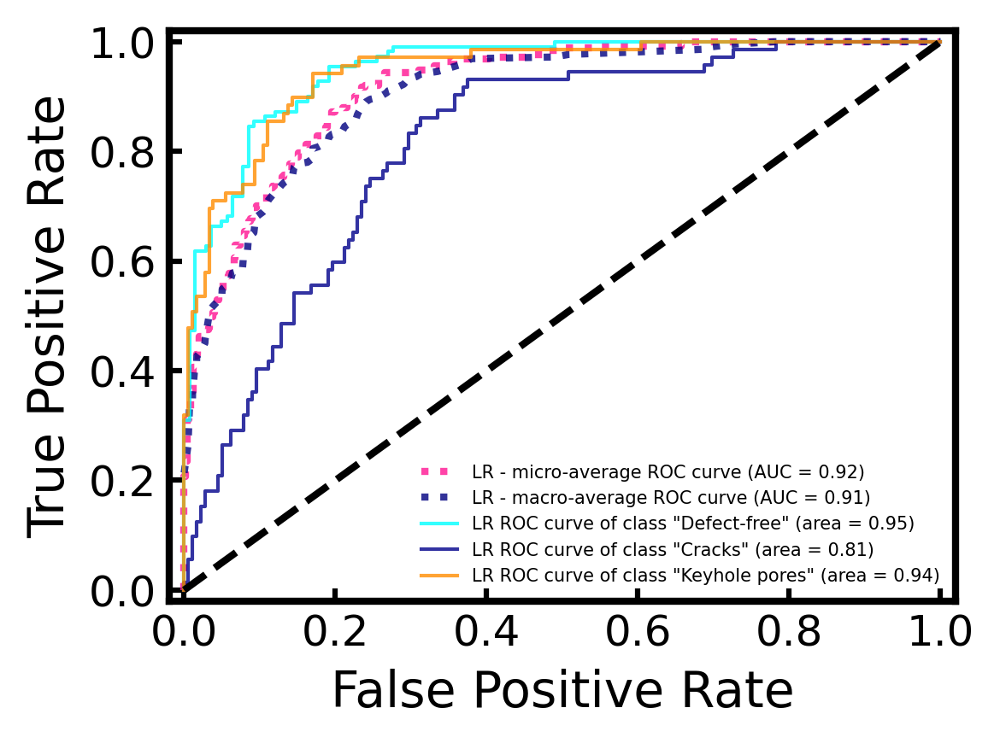

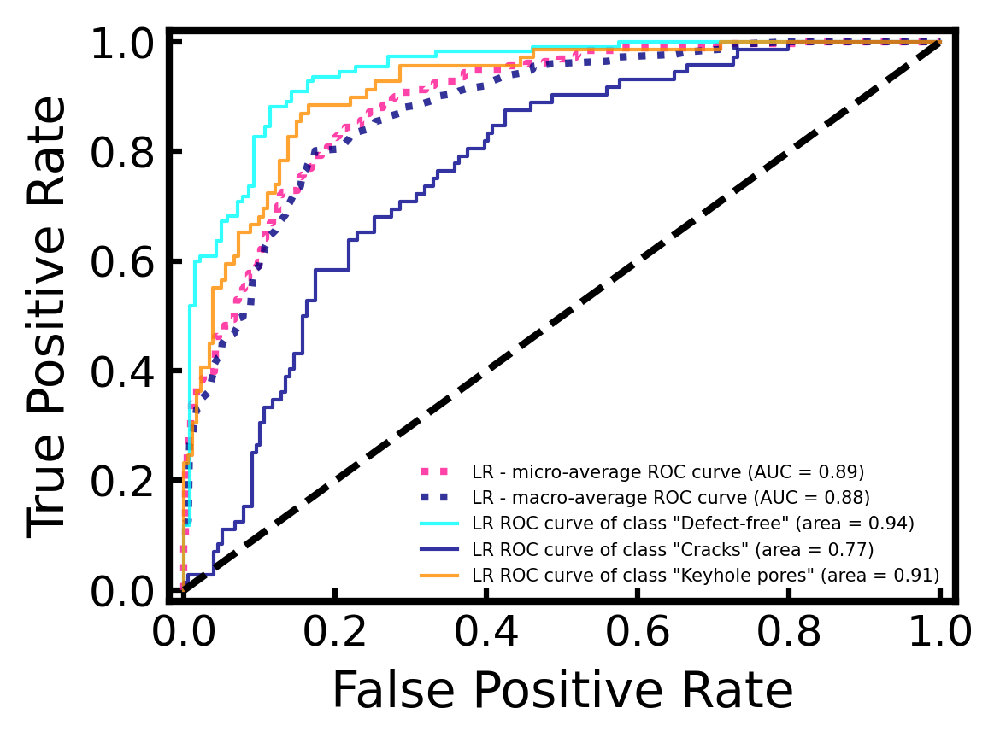

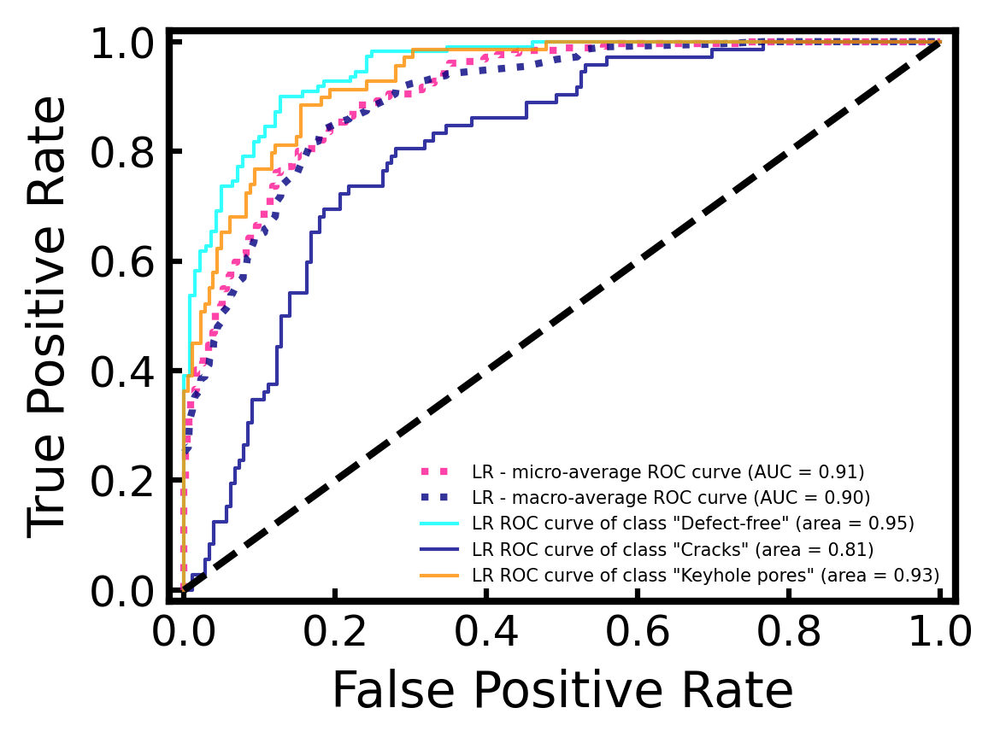

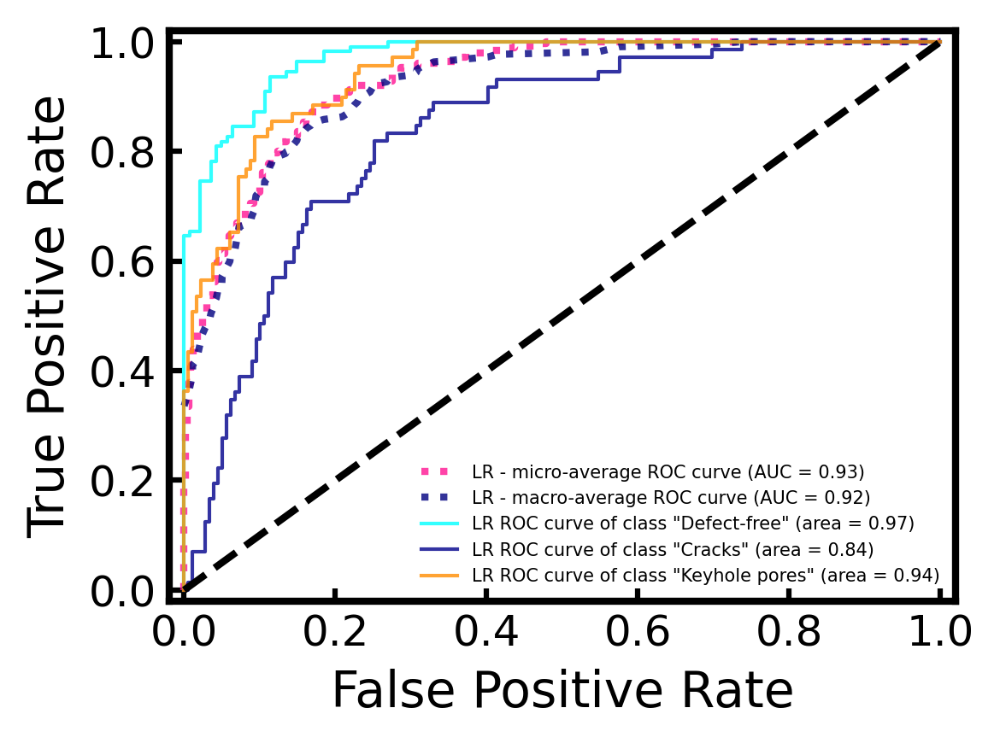

In [32]:
LR_original = logistic_regression_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
LR_equalized = logistic_regression_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
LR_bandpassed = logistic_regression_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
LR_denoised = logistic_regression_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### SVM

In [33]:
def SVM_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                        labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "SVM"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    
    # Optimize the SVM Classfier's hyper-parameters:
    # Ref: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
    tuned_parameters = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-4], 'C': [1, 10, 100, 1000]},
                        {'kernel': ['linear'], 'C': [1, 10, 100, 1000]}]
    clf = GridSearchCV(svm.SVC(), tuned_parameters, scoring="accuracy", cv=5)  
    # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    # , "f1_macro", "f1_micro", "roc_auc"
    clf.fit(X_train, Y_train)
    
    print("\n--------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    print("\nBest parameters set found on development set:")
    print(clf.best_params_)
    
    score = clf.score(X_test, Y_test)
    print("\nTest score: %.3f" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of SVM classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=3)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
 
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################

   
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    y_score = classifier.fit(X_train, Y_train_ohe).decision_function(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


--------------------------------------------------

-------------Signal type: original-----------

Best parameters set found on development set:
{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}

Test score: 0.793

Accuracy of SVM classifier (testing data):
0.7928286852589641

classification report:
              precision    recall  f1-score   support

           0    0.87500   0.89091   0.88288       110
           1    0.62821   0.68056   0.65333        72
           2    0.85246   0.75362   0.80000        69

    accuracy                        0.79283       251
   macro avg    0.78522   0.77503   0.77874       251
weighted avg    0.79801   0.79283   0.79425       251

Test Accuracy (cross-validation) for SVM = 0.78497 ± 0.00986
micro-averaging AUC for SVM = 0.92798 ± 0.00000
Saving figure ROC_SVM_original

--------------------------------------------------

-------------Signal type: equalized-----------

Best parameters set found on development set:
{'C': 1000, 'gamma': 0.001, 'kernel

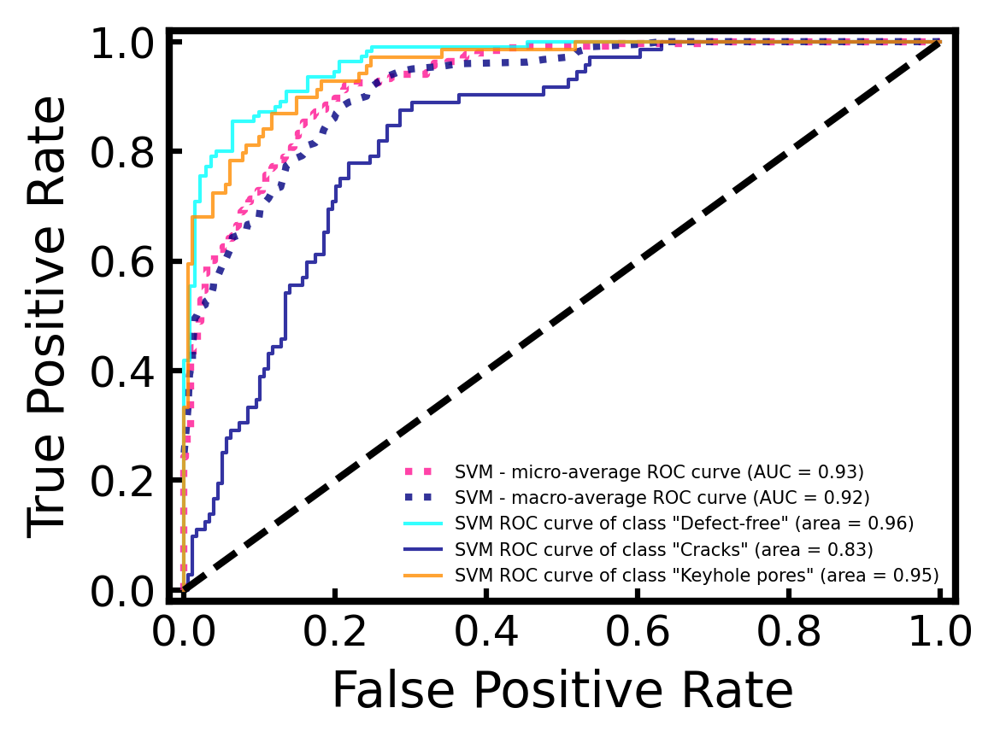

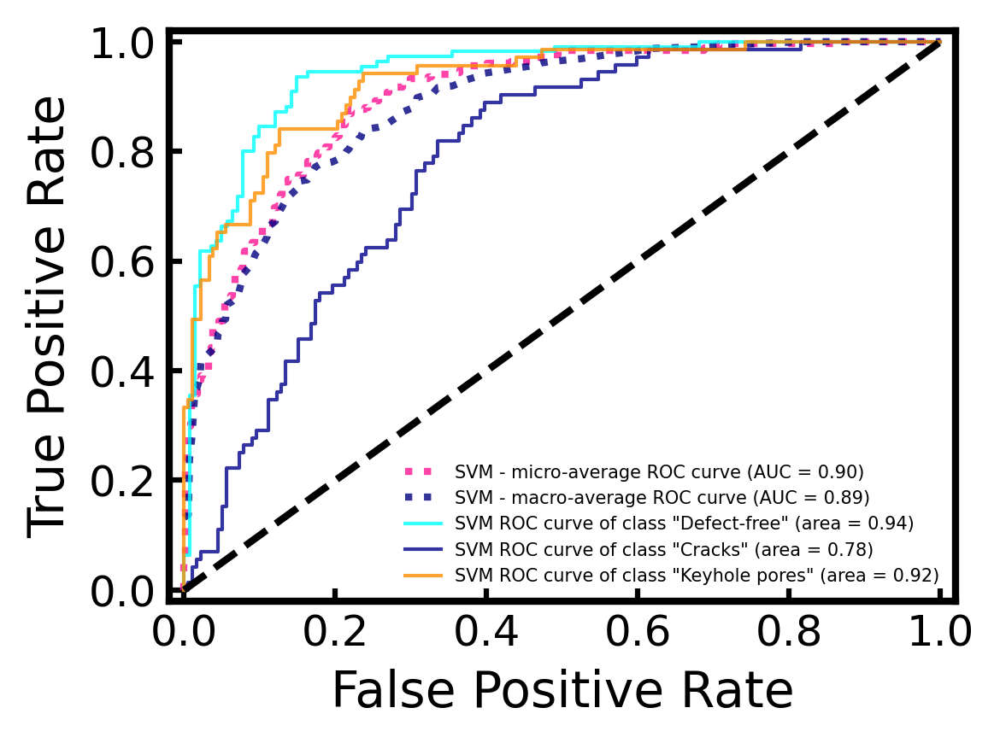

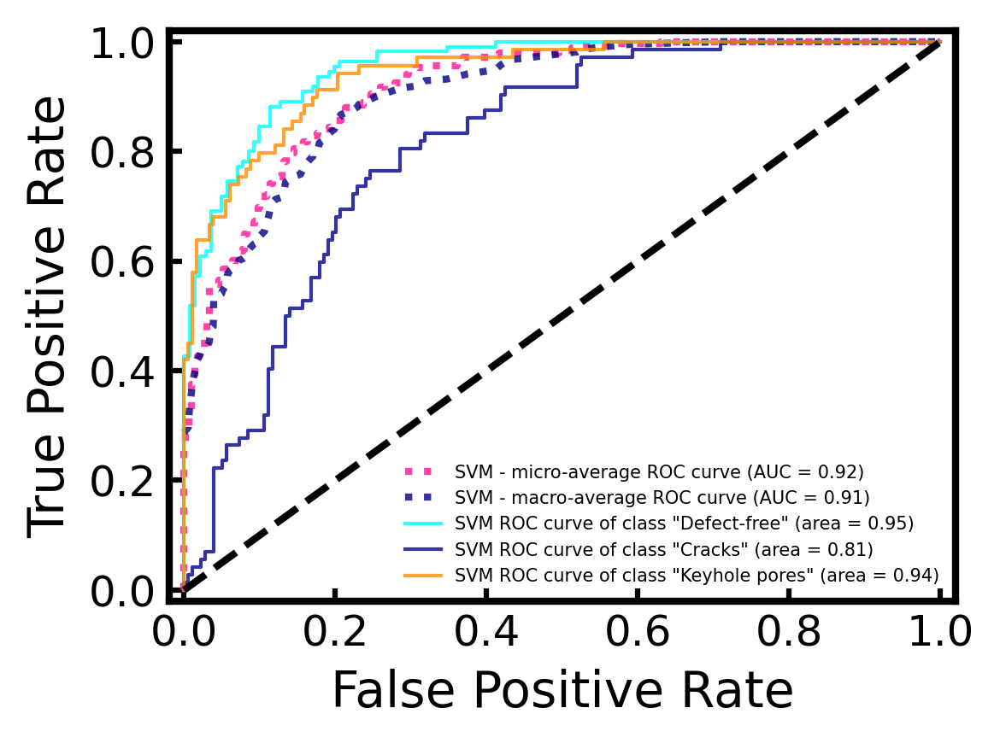

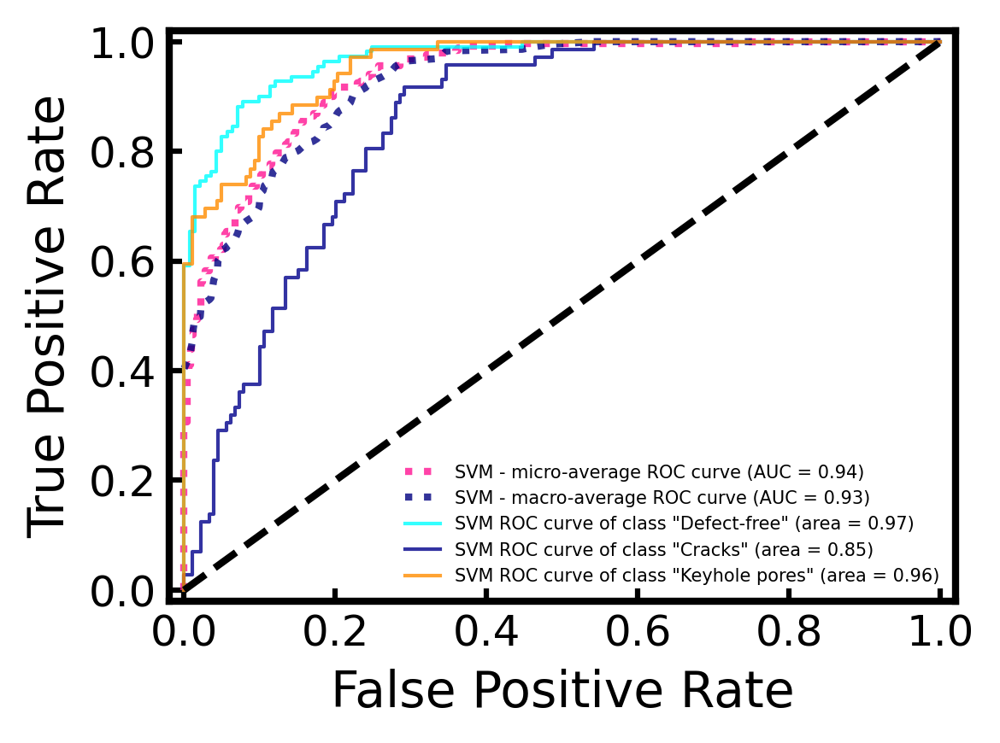

In [34]:
SVM_original =  SVM_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
SVM_equalized = SVM_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
SVM_bandpassed = SVM_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
SVM_denoised = SVM_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### Neural Network Classification

In [ ]:
def neural_network_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                                  labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "NN"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2, 3])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2, 3])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    tuned_parameters = {'hidden_layer_sizes': [(32, 64, 128, 64 ), 
                                               (16, 32, 64, 32 ), 
                                               (16, 32, 64, 128)],
                        'activation': ['relu'],
                        'solver': ['lbfgs', 'adam'],
                        'learning_rate': ['constant', 'adaptive'], # 'invscaling'
                        'max_iter' : [500, 1000, 1500], 
                        "alpha": [1e-7, 1e-1]}    # a dict (dictionary)

    clf = GridSearchCV(MLPClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    score = clf.score(X_test, Y_test)
    print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of logistic regression classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkorange", "cornflowerblue"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class {0} (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)

In [ ]:
# neural_network_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
# neural_network_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
# neural_network_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
# neural_network_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

### Gradient Boosting

In [35]:
def gradient_boosting_classification(X, Y, auc_mean_list, auc_std_list, accuracy_mean_list, accuracy_std_list, signal_type, 
                                  labels_=['Defect-free', 'Cracks','Keyhole pores']):
    ################--------------------------------------------------------------------#####################
    ################------Step 1: Preparation, standarization, and train test split-----#####################
    ################--------------------------------------------------------------------#####################
    classifier_name = "GB"
    n_classes = len(labels_)
    
    # Transform the feature data X to zero mean and unit variance:
    X = StandardScaler().fit_transform(X)
    # Split the data into training and testing sets:
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, shuffle=True)
    
    # One-hot-encode the ouput
    Y_test_ohe = label_binarize(Y_test, classes=[0, 1, 2])
    Y_train_ohe = label_binarize(Y_train, classes=[0, 1, 2])
    
    ################--------------------------------------------------------------------#####################
    ################------Step 2: Hyperparameter Optimization using Grid Search---------#####################
    ################--------------------------------------------------------------------#####################
    print("\n-------------------------------------------------------------------------------------------------")
    print("\n-------------Signal type: " + signal_type + "-----------")
    
    tuned_parameters = {'n_estimators': [1, 10, 100, 200, 500]}    # a dict (dictionary)

    clf = GridSearchCV(GradientBoostingClassifier(), tuned_parameters, scoring="accuracy", cv=5)  # for scoring metrics: https://scikit-learn.org/0.15/modules/model_evaluation.html#the-scoring-parameter-defining-model-evaluation-rules
    clf.fit(X_train, Y_train)

    score = clf.score(X_test, Y_test)
    print("\nTest score: %s" % score)

    Y_predict = clf.predict(X_test)
    # print("\nY_predict (testing data) = ")
    # print(Y_predict)

    print("\nAccuracy of logistic regression classifier (testing data):")
    print(metrics.accuracy_score(Y_test, Y_predict))

    print("\nclassification report:")
    print(classification_report(Y_test, Y_predict,digits=5))
    
    filename = "models/" + classifier_name + "_" + signal_type +'.joblib'
    joblib.dump(clf, filename)

    # accuracy_list.append(metrics.accuracy_score(Y_test, Y_predict))
    #################--------------------------------------------------------------------#####################
    ################------Step 3: Perform cross-validation on the model ------- ---------#####################
    ################---------------------------------------------------------------------#####################
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    
    for train, test in kf.split(X):

        X_shuffle, y_shuffle = shuffle(X, Y, random_state=0)
        y_shuffle = np.array(y_shuffle)

        # X_cv_train_before = X_shuffle[train]
        # X_cv_test_before = X_shuffle[test]
        X_train_cv = X_shuffle[train]
        X_test_cv = X_shuffle[test]
        y_train_cv = y_shuffle[train]
        y_test_cv = y_shuffle[test]

        clf.fit(X_train_cv, y_train_cv)

        trains.append(clf.score(X_train_cv, y_train_cv))
        tests.append(clf.score(X_test_cv, y_test_cv))

    trains = np.array(trains)
    tests = np.array(tests)


    test_accuracy_mean = tests.mean()
    test_accuracy_std = tests.std()

    train_accuracy_mean = trains.mean()
    train_accuracy_std =  trains.std()

    #################--------------------------------------------------------------------#####################
    ################---------------Step 4: AUC-ROC score measurement --------------------#####################
    ################---------------------------------------------------------------------#####################
    
    # ----------------Learn to predict each class against the other------------------------
    classifier = OneVsRestClassifier(clf)
    # if classifier_name == 'SVC':
    #     y_score = classifier.fit(X_train, y_train).decision_function(X_test)
    # else:
    y_score = classifier.fit(X_train, Y_train_ohe).predict_proba(X_test)
    
    # ---------------Compute ROC curve and ROC area for each class-------------------------
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test_ohe[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(Y_test_ohe.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------Plot all ROC curves-------------------------------
    plt.figure(figsize = (4,3), dpi = 300)
    widths = 2
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(widths)

        tick_width = 1.5
    plt.tick_params(direction = 'in', width = tick_width)
    
    #---------------------------(1) micro and macro ROC curve---------------------------
    plt.plot(fpr["micro"], tpr["micro"],
             label=classifier_name + ' - micro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=2, alpha = 0.8) #deeppink, midnightblue

    plt.plot(fpr["macro"], tpr["macro"],
             label=classifier_name + ' - macro-average ROC curve (AUC = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=2, alpha = 0.8) #navy, gold
    
    #---------------------------(2) ROC curve for each class---------------------------
    colors = cycle(["aqua", "darkblue", "darkorange", "red"])
    # colors = cycle(['0.45', 'steelblue',  'olive', 'silver'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i],tpr[i],color=color,
                 lw=1, alpha = 0.8,
                 label=classifier_name + " ROC curve of class \"{0}\" (area = {1:0.2f})".format(labels_[i], roc_auc[i])) 

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([-0.02, 1.02])
    plt.ylim([-0.02, 1.02])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    # plt.title("ROC curve")
    plt.legend(loc="lower right",  fontsize = '5', frameon = False)
    # plt.show()
    
    #----------------------------------Extract the auc score to list-----------------------------------
    auc_score_list = []
    auc_score_list.append(auc(fpr["micro"], tpr["micro"]))
    
    auc_score_array = np.array(auc_score_list)
    auc_mean = auc_score_array.mean()
    auc_std = auc_score_array.std()
    
    
    #################--------------------------------------------------------------------#####################
    ################----------Step 5: Append all the matrix to the list -----------------#####################
    ################---------------------------------------------------------------------#####################
    
    auc_mean_list.append(auc_mean)
    auc_std_list.append(auc_std)
    accuracy_mean_list.append(test_accuracy_mean)
    accuracy_std_list.append(test_accuracy_std)
    
    print('Test Accuracy (cross-validation) for' , classifier_name, '= {:.5f} ± {:.5f}'.format(test_accuracy_mean, test_accuracy_std))
    print('micro-averaging AUC for' , classifier_name, '= {:.5f} ± {:.5f}'.format(auc_mean, auc_std))
    save_fig("ROC_" + classifier_name + "_" + signal_type)
    
    return [Y_predict, Y_test]


-------------------------------------------------------------------------------------------------

-------------Signal type: original-----------

Test score: 0.8207171314741036

Accuracy of logistic regression classifier (testing data):
0.8207171314741036

classification report:
              precision    recall  f1-score   support

           0    0.87826   0.91818   0.89778       110
           1    0.71875   0.63889   0.67647        72
           2    0.81944   0.85507   0.83688        69

    accuracy                        0.82072       251
   macro avg    0.80549   0.80405   0.80371       251
weighted avg    0.81634   0.82072   0.81755       251

Test Accuracy (cross-validation) for GB = 0.79054 ± 0.01841
micro-averaging AUC for GB = 0.93738 ± 0.00000
Saving figure ROC_GB_original

-------------------------------------------------------------------------------------------------

-------------Signal type: equalized-----------

Test score: 0.8167330677290837

Accuracy of logistic 

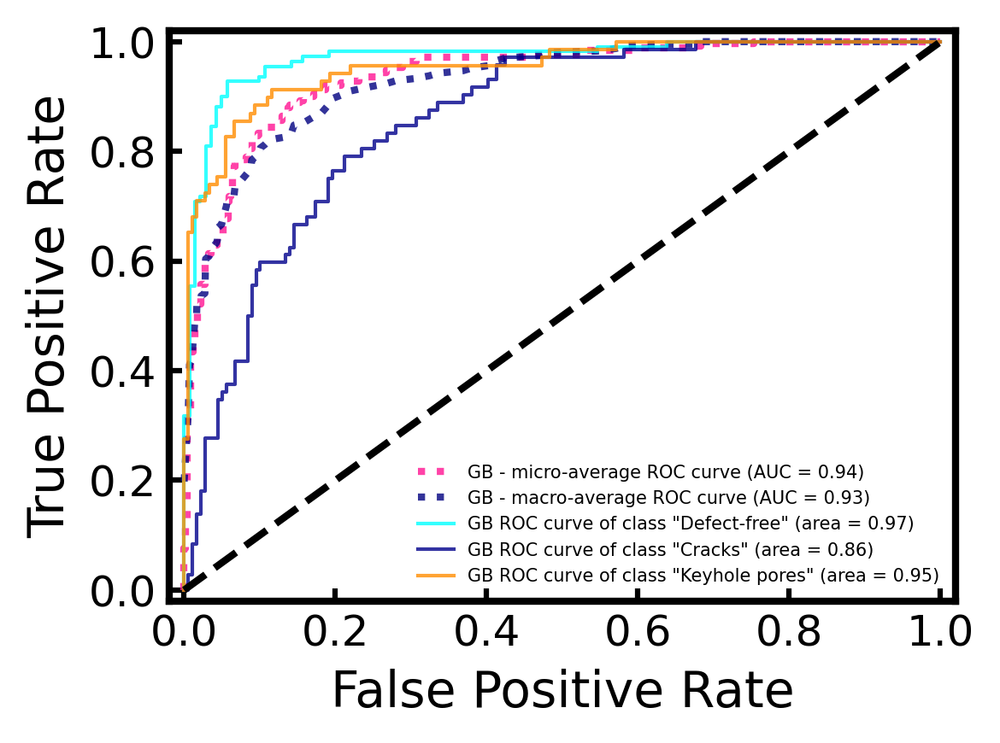

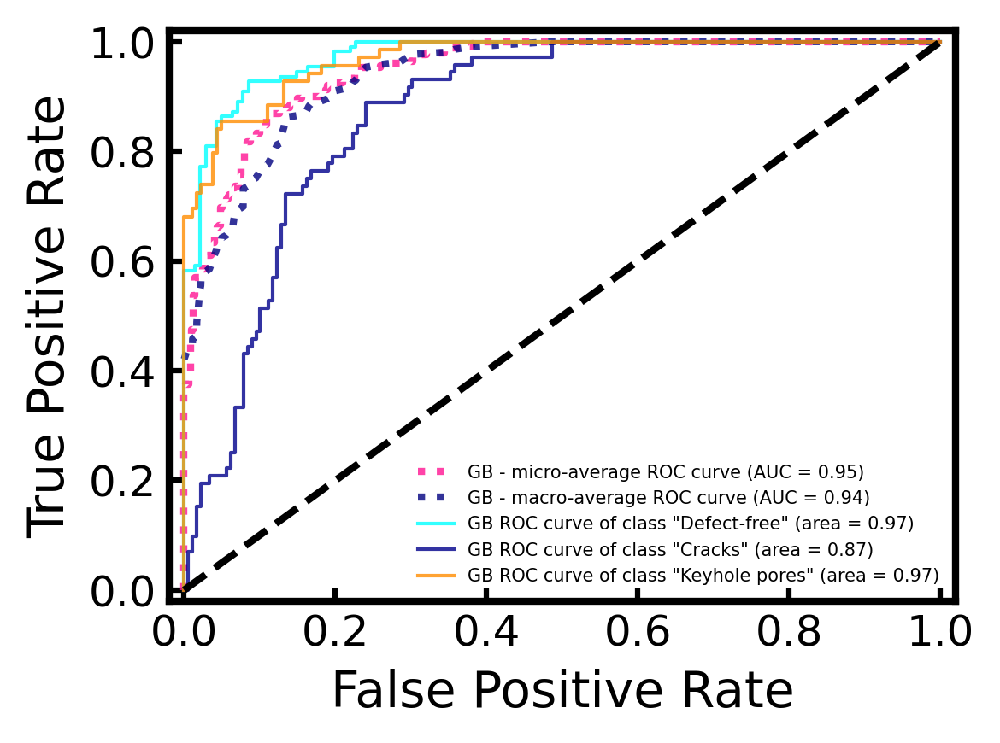

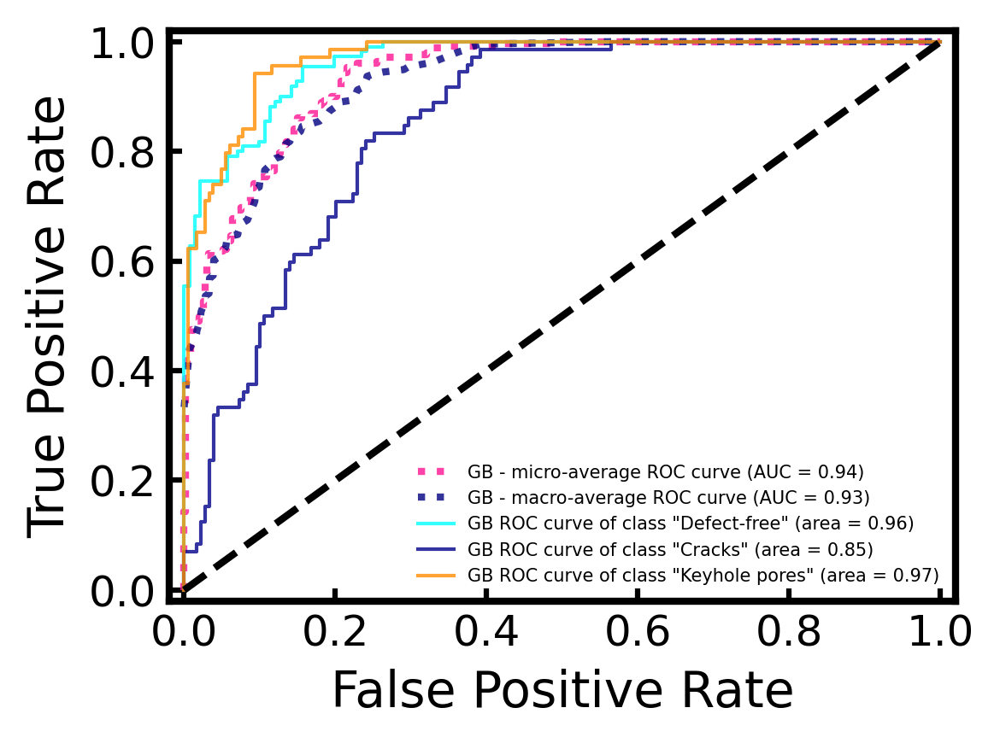

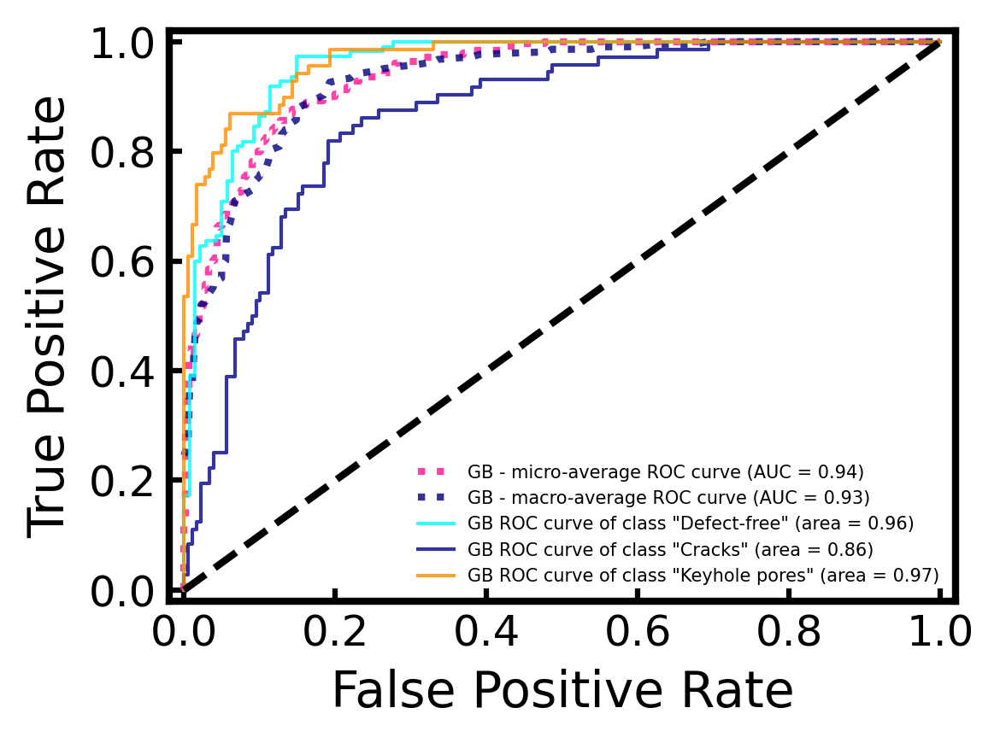

In [36]:
GB_original =  gradient_boosting_classification(X_original_selected, y, original_auc_mean, original_auc_std, original_accuracy_mean_list, original_accuracy_std_list, "original")
GB_equalized =  gradient_boosting_classification(X_equalized_selected, y, equalized_auc_mean, equalized_auc_std, equalized_accuracy_mean_list, equalized_accuracy_std_list, "equalized")
GB_bandpassed =  gradient_boosting_classification(X_bandpassed_selected, y, bandpassed_auc_mean, bandpassed_auc_std, bandpassed_accuracy_mean_list, bandpassed_accuracy_std_list, "bandpassed")
GB_denoised =  gradient_boosting_classification(X_denoised_selected, y, denoised_auc_mean, denoised_auc_std, denoised_accuracy_mean_list, denoised_accuracy_std_list, "denoised")

In [62]:
model_gb_denoised = joblib.load('models/GB_denoised.joblib')
model_gb_original.score(X_denoised_selected, y)

0.38609112709832133

## Result Analysis

In [ ]:
# from matplotlib import pyplot as plt
# plotdata = pd.DataFrame({
#     "raw":original_accuracy_list,
#     "equalized": equalized_accuracy_list,
#     "bandpassed": bandpassed_accuracy_list,
#     "denoised":denoised_accuracy_list},

#     # index=["SVM", "Nearest Neighbors", "Naive Bayes", "AdaBoost", "Random forest", "Decision tree", "Gaussian process"]
#     # index=["SVM", "K Nearest Neighbors", "Gaussian process", "Random forest", "Decision tree","AdaBoost", "Naive Bayes", "Logistic Regression"]
#     # index=["SVM", "K Nearest Neighbors", "Random forest", "Decision tree","AdaBoost", "Naive Bayes", "Logistic Regression"]
#     index=["SVM", "KNN", "RF", "DT","AdaBoost", "NB", "LR"]
# )

# ax= plotdata.plot(kind="bar",figsize=(10, 6), stacked=False, width=0.7) #xticks=(np.arange(0, 7, step=1)), xticklabels=plotdata.index # rotation=20
# # for container in ax.containers:
# #     ax.bar_label(container, fmt='%.2f', fontsize=10, padding=4, rotation=90)

# plt.title("Classification results (layer-wise)", fontsize = 20, y=1.1)
# # plt.xlabel("ML models",  fontsize = 18, labelpad=12)
# plt.xticks(fontsize = 16, rotation=45, ha='right')
# plt.ylim([0, 1])
# plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
# plt.legend(fontsize=12, bbox_to_anchor=(1.04,1), loc="upper left")
# plt.ylabel("Accuracy", fontsize = 18, labelpad=12)
# # plt.tick_params(direction = 'in', width = 5)

# # save_fig("classification result - (layer-wise)")

In [42]:
%store original_accuracy_mean_list 
%store equalized_accuracy_mean_list
%store bandpassed_accuracy_mean_list
%store denoised_accuracy_mean_list 

%store original_accuracy_std_list 
%store equalized_accuracy_std_list
%store bandpassed_accuracy_std_list
%store denoised_accuracy_std_list

Stored 'original_accuracy_mean_list' (list)
Stored 'equalized_accuracy_mean_list' (list)
Stored 'bandpassed_accuracy_mean_list' (list)
Stored 'denoised_accuracy_mean_list' (list)
Stored 'original_accuracy_std_list' (list)
Stored 'equalized_accuracy_std_list' (list)
Stored 'bandpassed_accuracy_std_list' (list)
Stored 'denoised_accuracy_std_list' (list)


In [230]:
bandpassed_accuracy_mean_list

[0.7386091127098321,
 0.6786677290836652,
 0.6354964143426296,
 0.6778577138289368,
 0.8129496402877697,
 0.7537976095617529,
 0.7777777777777778,
 0.8121593625498008]

In [231]:
original_accuracy_mean_list

[0.7202238209432453,
 0.6370677290836654,
 0.5755314741035857,
 0.4940047961630695,
 0.7721822541966427,
 0.7489848605577689,
 0.7849720223820943,
 0.7889434262948207]

In [ ]:
# def create_dataframe_metric_accuracy(mean_list, std_list, models, name):
#     df = pd.DataFrame(mean_list)

#     df.columns = ["value"]
#     df["std"] = std_list
#     df["models"] = models
#     return df

# df_original_accuracy = create_dataframe_metric_accuracy(original_accuracy_mean_list,original_accuracy_std_list, models, "original").sort_values(by="value", axis=0)
# df_equalized_accuracy = create_dataframe_metric_accuracy(equalized_accuracy_mean_list,equalized_accuracy_std_list, models, "equalized" ).sort_values(by="value", axis=0)
# df_bandpassed_accuracy = create_dataframe_metric_accuracy(bandpassed_accuracy_mean_list,bandpassed_accuracy_std_list, models, "bandpassed").sort_values(by="value", axis=0) 
# df_denoised_accuracy = create_dataframe_metric_accuracy(denoised_accuracy_mean_list, denoised_accuracy_std_list, models, "denoised").sort_values(by="value", axis=0) 

In [ ]:
# df_denoised_accuracy["models"].to_list()

In [ ]:
# df_accuracy = df_bandpassed_accuracy.merge(df_original_accuracy,on='models').merge(df_equalized_accuracy,on='models').merge(df_denoised_accuracy,on='models')
# # df_accuracy = df_accuracy.merge(df_denoised_accuracy,on='models')
# df_accuracy.columns = ["mean_bandpassed", "std_bandpassed","models", "mean_original", "std_original",
#                       "mean_equalized", "std_equalized", "mean_denoised", "std_denoised"]
# df_accuracy

Saving figure accuracy_summary


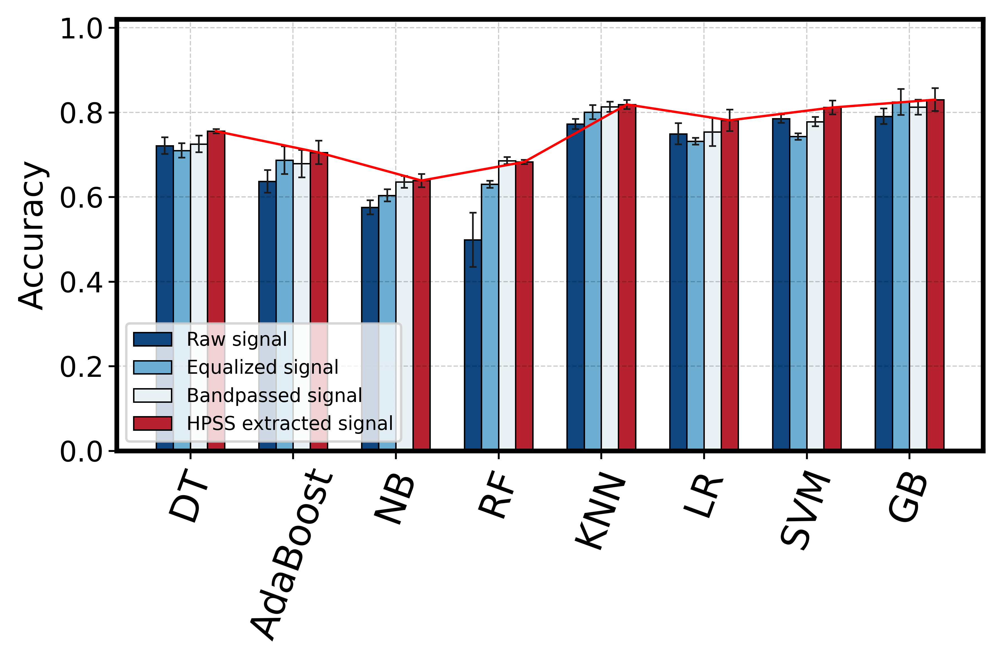

In [46]:
models = ["DT","AdaBoost", "NB", "RF","KNN", "LR","SVM", "GB"]
# models = df_bandpassed_accuracy["models"].to_list()

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
# plt.tick_params(direction = 'in', width = tick_width)


rects1 = ax.bar(3*x - 1.5*width, original_accuracy_mean_list, width, yerr = original_accuracy_std_list,error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7), 
                 edgecolor ='k', linewidth=0.6, label='Raw signal', alpha =1 , color = '#104680') #, color = 'seagreen' (016, 070, 128) #104680
rects2 = ax.bar(3*x - 0.5*width, equalized_accuracy_mean_list, width, yerr = equalized_accuracy_std_list , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='Equalized signal', alpha = 1, color = '#6DADD1') # color = 'wheat' (109,173, 209) #6DADD1
rects3 = ax.bar(3*x + 0.5*width, bandpassed_accuracy_mean_list, width, yerr = bandpassed_accuracy_std_list , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='Bandpassed signal', alpha = 1,  color = '#E9F1F4') #,  color = 'steelblue' (233, 241, 244) #E9F1F4
rects4 = ax.bar(3*x + 1.5*width, denoised_accuracy_mean_list, width, yerr = denoised_accuracy_std_list , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='HPSS extracted signal', alpha = 1,  color = "#B72230") #f03b1a ,  color = 'darkorange' (183, 034, 048)--> B72230 

ax.plot(3*x + 1.5*width, denoised_accuracy_mean_list, "r", linewidth =1)
# original colorlist: midnightblue, red, steelblue, olive

ax.set_ylabel('Accuracy')
#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)

plt.xticks(fontsize=16,  rotation=70, ha='center')
ax.tick_params(axis="y",direction="out", pad= 2)
ax.tick_params(axis="x",direction="out", pad= 2)

ax.set_xticklabels(models)
ax.set_ylim([0, 1.02])
ax.legend(loc = 'lower left',  fontsize = '8', framealpha = 0.8)

ax.grid(zorder=3, linestyle='--',linewidth=0.5, alpha=0.2, color = "k") #linestyle='--', color='r'

fig.tight_layout()
# plt.show()
save_fig("accuracy_summary")

### AUC-ROC comparison

In [39]:
%store original_auc_mean 
%store equalized_auc_mean
%store bandpassed_auc_mean
%store denoised_auc_mean 

%store original_auc_std 
%store equalized_auc_std
%store bandpassed_auc_std
%store denoised_auc_std

Stored 'original_auc_mean' (list)
Stored 'equalized_auc_mean' (list)
Stored 'bandpassed_auc_mean' (list)
Stored 'denoised_auc_mean' (list)
Stored 'original_auc_std' (list)
Stored 'equalized_auc_std' (list)
Stored 'bandpassed_auc_std' (list)
Stored 'denoised_auc_std' (list)


In [38]:
# def create_dataframe_metric_auc(mean_list, std_list, models, name):
#     df = pd.DataFrame(mean_list)

#     df.columns = ["value"]
#     df["std"] = std_list
#     df["models"] = models
#     return df

# df_original_auc = create_dataframe_metric_accuracy(original_auc_mean,original_auc_std, models, "original").sort_values(by="value", axis=0)
# df_equalized_auc = create_dataframe_metric_accuracy(equalized_auc_mean,equalized_auc_std, models, "equalized" ).sort_values(by="value", axis=0)
# df_bandpassed_auc = create_dataframe_metric_accuracy(bandpassed_auc_mean,bandpassed_auc_std, models, "bandpassed").sort_values(by="value", axis=0) 
# df_denoised_auc = create_dataframe_metric_accuracy(denoised_auc_mean, denoised_auc_std, models, "denoised").sort_values(by="value", axis=0) 

# df_auc = df_bandpassed_auc.merge(df_original_auc,on='models').merge(df_equalized_auc,on='models').merge(df_denoised_auc,on='models')
# # df_accuracy = df_accuracy.merge(df_denoised_accuracy,on='models')
# df_auc.columns = ["mean_bandpassed", "std_bandpassed","models", "mean_original", "std_original",
#                       "mean_equalized", "std_equalized", "mean_denoised", "std_denoised"]
# df_auc

In [ ]:
# %store df_auc 
# %store df_accuracy

Saving figure AUC_ROC summary


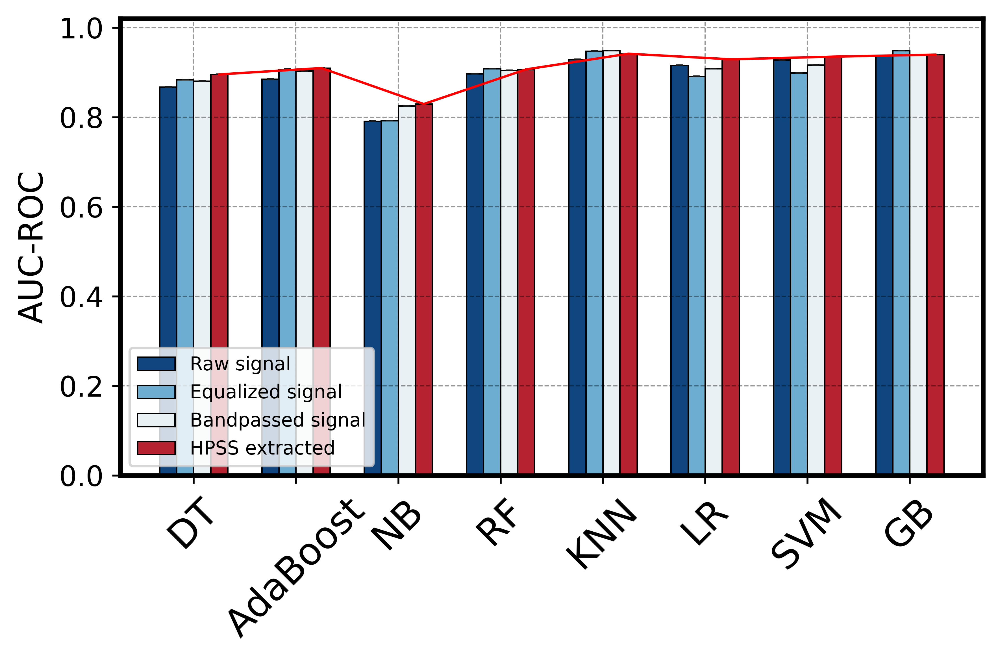

In [40]:
models = ["DT","AdaBoost", "NB", "RF","KNN","LR","SVM", "GB" ]

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
# plt.tick_params(direction = 'in', width = tick_width)

# rects1 = ax.bar(3*x - 1.5*width, original_auc_mean, width, yerr = original_auc_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Raw signal', color = 'midnightblue', alpha =0.9 )
# rects2 = ax.bar(3*x - 0.5*width, equalized_auc_mean, width, yerr = equalized_auc_std , error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7),label='Equalized signal',  color = 'red', alpha = 0.9)
# rects3 = ax.bar(3*x + 0.5*width, bandpassed_auc_mean, width, yerr = bandpassed_auc_std , error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7),label='Bandpass filtered signal',  color = 'steelblue', alpha = 0.9)
# rects4 = ax.bar(3*x + 1.5*width, denoised_auc_mean, width, yerr = denoised_auc_std , error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7),label='Final denoised signal',  color = 'olive', alpha = 0.9)

rects1 = ax.bar(3*x - 1.5*width, original_auc_mean, width, yerr = original_auc_std,error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7), 
                 edgecolor ='k', linewidth=0.6, label='Raw signal', alpha =1 , color = '#104680') #, color = 'seagreen'
rects2 = ax.bar(3*x - 0.5*width, equalized_auc_mean, width, yerr = equalized_auc_std , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='Equalized signal', alpha = 1, color = '#6DADD1') #wheat
rects3 = ax.bar(3*x + 0.5*width, bandpassed_auc_mean, width, yerr = bandpassed_auc_std , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='Bandpassed signal', alpha = 1,  color = '#E9F1F4') #,  color = 'steelblue'
rects4 = ax.bar(3*x + 1.5*width, denoised_auc_mean, width, yerr = denoised_auc_std , error_kw = dict(ecolor= '0.1', lw=0.7, capsize=1.5, capthick=0.7),
                 edgecolor ='k', linewidth=0.6, label='HPSS extracted', alpha = 1,  color = "#B72230") #f03b1a ,  color = 'darkorange'


ax.set_ylabel('AUC-ROC')

ax.plot(3*x + 1.5*width, denoised_auc_mean, "r", linewidth =1)

#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)
ax.set_xticklabels(models)
ax.set_ylim([0, 1.02])
ax.legend(loc = 'lower left',  fontsize = '8', framealpha = 0.8)
plt.xticks(fontsize=16,  rotation=45, ha='center')

fig.tight_layout()
# plt.show()
ax.grid(zorder=3, linestyle='--',linewidth=0.5, alpha=0.4, color = "k") #linestyle='--', color='r'

save_fig("AUC_ROC summary")

### Model Prediction and evaluation on test set

In [234]:
### Define function to predict X_test, return y_pred & y_true and print the classification report
def class_report(modelname, X_test, y_test, classes=['Keyhole pores', 'Cracks', 'Defect-free']):
    ### predict the X_test
    # pred = modelname.predict_classes(X_test) # deprecated
    predict_x=modelname.predict(X_test) 
    pred=np.argmax(predict_x,axis=1)
    
    # compile predicted results
    
    y_true, y_pred = [], []
    # classes = le.classes_
    
    for idx, preds in enumerate(pred):
        y_true.append(classes[np.argmax(y_test[idx])])
        y_pred.append(classes[preds])
    
    print(classification_report(y_true, y_pred,digits=4))
    return y_true, y_pred

### Model (preliminary) Evaluation Summary

To evaluate the effectiveness of the classification model, metrics used to assess are:

1. **$Precision = TP/(FP+TP)$**

**Precision** provides the *positive predictive value, the proportion of samples that belong in category $x$ that are correctly placed in category $x$*. Example, among all predicted defect, how many did I predict correctly? High precision is with low FP (predict to be cracks but actually is not).

2. **$f1 = 2*(Precision*Recall)/(Precision + Recall)$**

**Weighted average for precision and recall**. This score takes both FN and FP into account as $Recall = TP/(FN+TP)$. This is better metric for evaluating an uneven class distribution problem, which is the case in this project. 

3. $Accuracy = (TP+TN)/(All predict)$

Model achieve pretty high **>80%** overall accuracy.

The model able to classify well for defects sounds. However, it did badly on the detecting ***cracks***

- In conclusion, the initial model without Hyper-parameter tuning did pretty well in general. But it does not outperform the traditional ML algorithms. And it did poorly in classifying the cracking regimes.

In [63]:
yt, yp = RF_denoised

In [64]:
yp= np.argmax(yp, axis=1)
yt= np.argmax(yt, axis=1)

In [65]:
yt

array([0, 2, 2, 2, 0, 1, 2, 2, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 2, 0, 0, 2,
       0, 1, 0, 0, 0, 1, 1, 1, 2, 2, 0, 2, 0, 1, 2, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 2, 1, 2, 2, 0, 1, 2, 2,
       2, 1, 2, 0, 1, 0, 0, 1, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 0, 2, 0, 0, 1, 0,
       2, 2, 0, 1, 1, 1, 2, 0, 1, 0, 0, 2, 2, 2, 1, 2, 0, 0, 0, 0, 0, 2,
       0, 0, 1, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 1, 0, 2, 1, 0, 1, 0, 0, 1,
       0, 2, 1, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 1, 2, 0, 1, 0, 0, 2, 0, 0,
       2, 1, 2, 0, 0, 0, 0, 1, 2, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 1, 2, 0, 2, 1, 0, 2, 2,
       1, 1, 0, 1, 0, 2, 1, 0, 1, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0, 1, 1, 2,
       0, 0, 0, 0, 0, 0, 0, 2, 0])

### Category/ label that was wrongly classified by the model

In [ ]:
# ### View the class with WRONG classificaiton 
# pred_result = list(zip(yt, yp))
# result_df = pd.DataFrame(pred_result, columns = ['label', 'pred_label'])
# result_df[result_df['label'] != result_df['pred_label']]

### Confusion Matrix

In [53]:
### Function to plot confusion matrix

def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(7, 7))
    im_ratio = cm.shape[1]/cm.shape[0]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=18, pad=12)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, fontsize=12)
    plt.yticks(tick_marks, classes, fontsize=12)

    fmt = '.3f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 fontsize = 16, 
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Ground Truth', fontsize=20, labelpad =12)
    plt.xlabel('Predicted', fontsize=20, labelpad =12)
    plt.xticks(fontsize=16,  rotation=45, ha='right')
    plt.yticks(fontsize=16)
    cbar = plt.colorbar(orientation="vertical", pad=0.1, ticks=[0.1, 0.4,0.7, 0.8, 0.9],fraction=0.045*im_ratio)
    plt.clim(0,0.95)
    cbar.ax.tick_params(labelsize=14)
    cbar.ax.set_title('Accuracy',fontsize=16, pad = 12)
    plt.tight_layout()

    
    
def plot_confusion_matrix_sns(y_true, y_pred, classes):
    plt.figure(figsize=(10, 7))
    tick_marks = np.arange(len(classes))
    cm = confusion_matrix(y_true, y_pred)
    # convert to percentage and plot the confusion matrix
    cm_pct = cm.astype(float) / cm.sum(axis =1)[:,np.newaxis]
    sns.heatmap(cm_pct, annot=True, fmt='.3%', cmap='Blues', linewidths=2, linecolor='black') #cmap='Blues'
    plt.xticks(tick_marks, classes, horizontalalignment='center', rotation=70, fontsize=12)
    plt.yticks(tick_marks, classes, horizontalalignment="center", rotation=0, fontsize=12)
#     ax.set_xticklabels(
# #     ax.get_xticklabels(),
# #     # rotation=45,
# #     # horizontalalignment='right',
# #     fontsize = 2
# # )
    plt.ylabel('True label', fontsize=18)
    plt.xlabel('Predicted label', fontsize=18)
    

In [54]:
## Define function to get the confusion matrix and print out the plot as well

def conf_matrix(y_true, y_pred, classes=['Defect-free', 'Cracks','Keyhole pores'] ):
    cm = confusion_matrix(y_true, y_pred)
    
    # convert to percentage and plot the confusion matrix
    cm_pct = cm.astype(float) / cm.sum(axis =1)[:,np.newaxis]
    
    # classes = le.classes_
    print(cm)
    plot_confusion_matrix(cm_pct, classes)

[[100  24   6]
 [  9  38  13]
 [  1  10  50]]
Saving figure confusion_RF_denoised


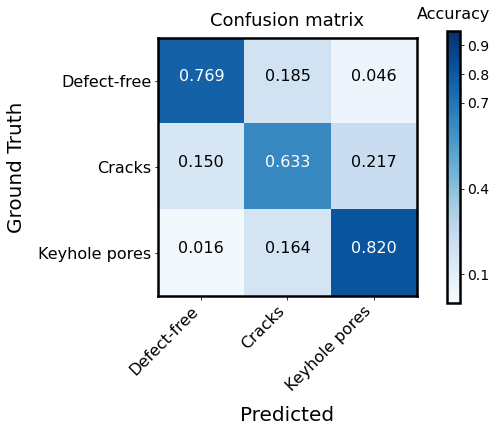

In [66]:
conf_matrix(yt, yp)
save_fig("confusion_RF_denoised")

[[64  9  3]
 [41 50 33]
 [ 5 13 33]]
Saving figure confusion_NB_original
[[80 14 10]
 [23 47 32]
 [ 7 11 27]]
Saving figure confusion_NB_equalized
[[83 15  7]
 [19 43 30]
 [ 8 14 32]]
Saving figure confusion_NB_bandpassed
[[82 13  6]
 [20 44 30]
 [ 8 15 33]]
Saving figure confusion_NB_denoised
[[87  9  0]
 [20 50 26]
 [ 3 13 43]]
Saving figure confusion_DT_original
[[85  9  0]
 [20 32  9]
 [ 5 31 60]]
Saving figure confusion_DT_equalized
[[89 13  2]
 [20 48 17]
 [ 1 11 50]]
Saving figure confusion_DT_bandpassed
[[95 25  1]
 [13 33  9]
 [ 2 14 59]]
Saving figure confusion_DT_denoised
[[69 11  3]
 [41 51 19]
 [ 0 10 47]]
Saving figure confusion_AdaBoost_original
[[88  8  0]
 [19 34 14]
 [ 3 30 55]]
Saving figure confusion_AdaBoost_equalized
[[88 19  3]
 [12 22  9]
 [10 31 57]]
Saving figure confusion_AdaBoost_bandpassed
[[86 11  1]
 [23 45 11]
 [ 1 16 57]]
Saving figure confusion_AdaBoost_denoised
[[95 13  0]
 [15 48 19]
 [ 0 11 50]]
Saving figure confusion_LR_original
[[91 13  2]
 [14 4

/tmp/ipykernel_3971/1513949397.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(7, 7))


[[97  9  1]
 [13 54 14]
 [ 0  9 54]]
Saving figure confusion_GB_equalized
[[96 13  0]
 [13 50 14]
 [ 1  9 55]]
Saving figure confusion_GB_bandpassed
[[95 12  1]
 [12 51 10]
 [ 3  9 58]]
Saving figure confusion_GB_denoised
[[102  22   0]
 [  6  41  15]
 [  2   9  54]]
Saving figure confusion_KNN_original
[[100  11   0]
 [  9  51  13]
 [  1  10  56]]
Saving figure confusion_KNN_equalized
[[103  12   0]
 [  7  52  18]
 [  0   8  51]]
Saving figure confusion_KNN_bandpassed
[[97  8  1]
 [11 51 11]
 [ 2 13 57]]
Saving figure confusion_KNN_denoised


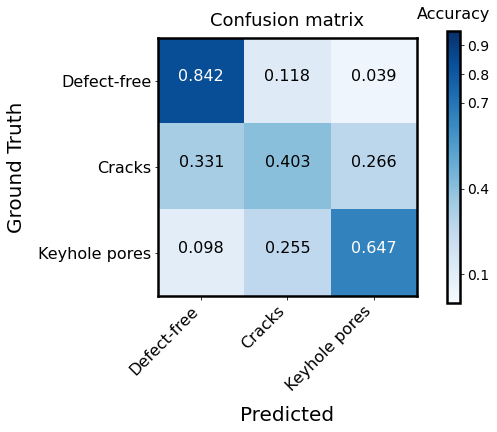

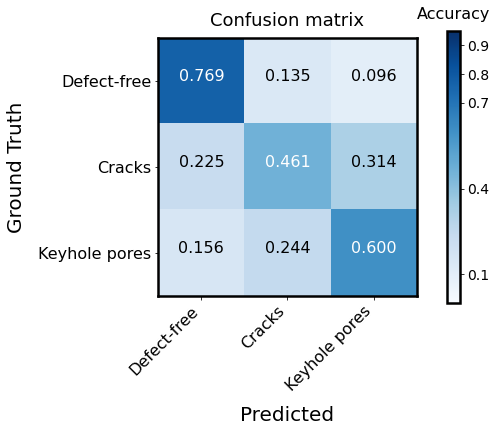

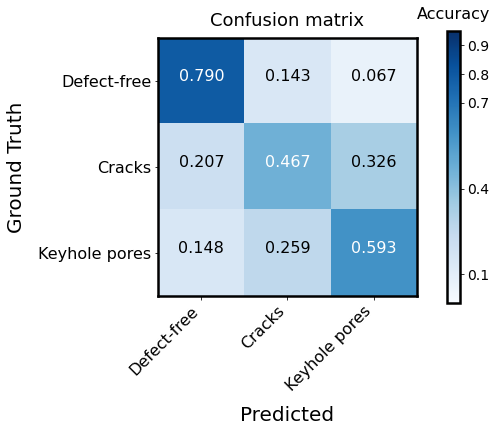

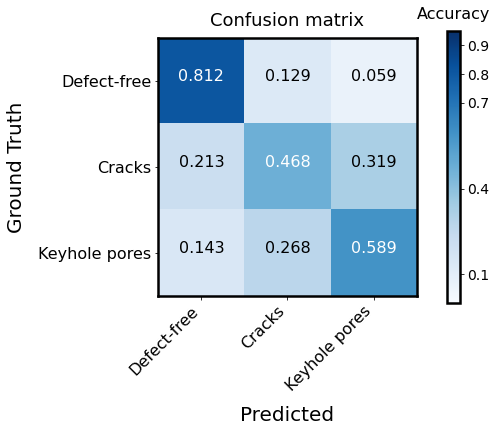

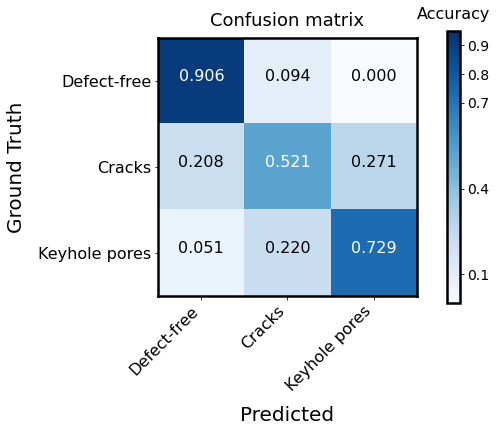

...

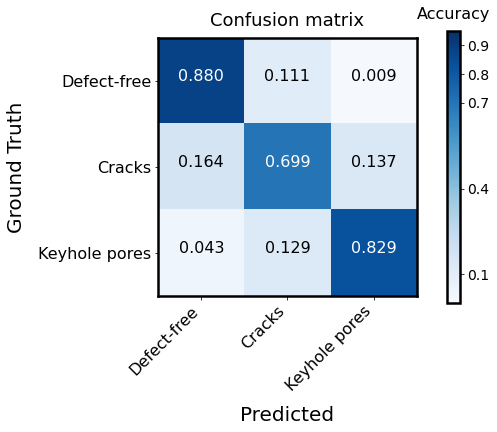

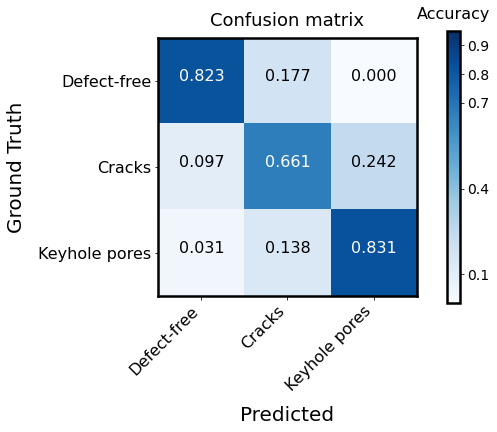

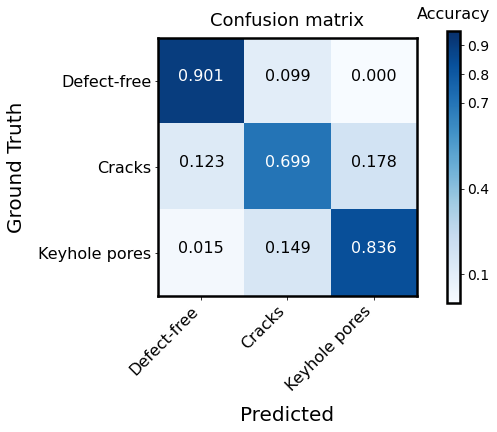

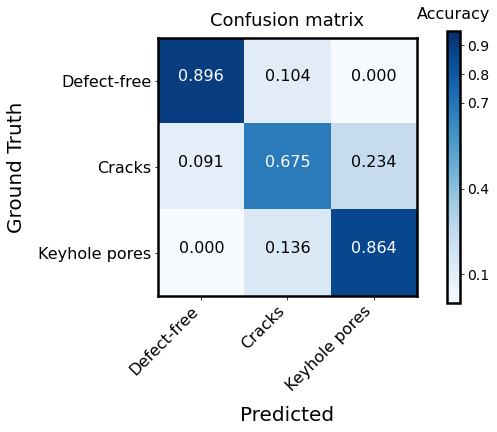

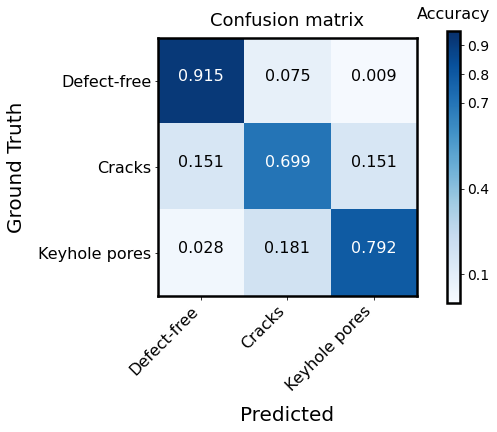

In [68]:
# [NB, DT, AaBoost, LR, RF, SVM, GB, KNN, MFCC-CNN]l
list_results = [NB_original, NB_equalized, NB_bandpassed, NB_denoised, 
                DT_original, DT_equalized, DT_bandpassed, DT_denoised,  
                Adaboost_original, Adaboost_equalized, Adaboost_bandpassed, Adaboost_denoised, 
                LR_original, LR_equalized, LR_bandpassed, LR_denoised, 
                SVM_original, SVM_equalized, SVM_bandpassed, SVM_denoised,  
                GB_original, GB_equalized, GB_bandpassed, GB_denoised,
                KNN_original, KNN_equalized, KNN_bandpassed, KNN_denoised, ]

name_list = ["NB_original", "NB_equalized", "NB_bandpassed", "NB_denoised",  
             "DT_original", "DT_equalized", "DT_bandpassed", "DT_denoised",
             "AdaBoost_original", "AdaBoost_equalized", "AdaBoost_bandpassed","AdaBoost_denoised", 
             "LR_original", "LR_equalized", "LR_bandpassed", "LR_denoised",
             "SVM_original", "SVM_equalized", "SVM_bandpassed", "SVM_denoised", 
             "GB_original", "GB_equalized", "GB_bandpassed", "GB_denoised", 
             "KNN_original", "KNN_equalized", "KNN_bandpassed", "KNN_denoised",]

for count, item in enumerate(list_results):
    yt, yp = item
    conf_matrix(yt, yp)
    filename = "confusion_" + name_list[count]
    save_fig(filename)

In [72]:
list_results_original = [NB_original, DT_original, Adaboost_original, 
                         LR_original, RF_original, SVM_original, GB_original,  KNN_original ]

list_results_equalized = [NB_equalized, DT_equalized, Adaboost_equalized, 
                         LR_equalized, RF_equalized, SVM_equalized, GB_equalized,  KNN_equalized ]

list_results_bandpassed = [NB_bandpassed, DT_bandpassed, Adaboost_bandpassed, 
                         LR_bandpassed, RF_banpassed, SVM_bandpassed, GB_bandpassed,  KNN_bandpassed ]

list_results_denoised = [NB_denoised, DT_denoised, Adaboost_denoised, 
                         LR_denoised, RF_denoised, SVM_denoised, GB_denoised,  KNN_denoised ]

In [73]:
%store list_results
%store list_results_original
%store list_results_equalized
%store list_results_bandpassed
%store list_results_denoised

Stored 'list_results' (list)
Stored 'list_results_original' (list)
Stored 'list_results_equalized' (list)
Stored 'list_results_bandpassed' (list)
Stored 'list_results_denoised' (list)
